In [1]:
import matplotlib
matplotlib.use('Agg')

import numpy as np
import collections
from functools import partial
from os.path import expanduser
from tqdm import tqdm
import h5py

from surround.image_processing import *
from surround.data_handling import *
from surround.efficient_coding import *
from aesthetics.plotting import *
from surround.modeling import gaussian, difference_of_gaussians

import pyret.filtertools as ft
from sklearn.decomposition import PCA
from scipy.stats import sem
from scipy.optimize import curve_fit, minimize
from scipy.interpolate import interp1d

# This is a bit of magic to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter

plt.style.use('deepretina')

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

Changes from previous versions:
- Constrain spacing by photoreceptor spacing
- Constrain width by visual field of salamander retina  
- Constrain output power instead of output variance

In [2]:
microns_per_degree = 50.0 # depends on species; this is for salamander
photoreceptor_width = 10.0/microns_per_degree # salamander photoreceptors have width of 10-20 microns
retina_width = 4000.0/microns_per_degree # salamander retina is about 4 mm
frequency_spacing = 1./retina_width # this is the lowest non-DC frequency we can estimate
highest_frequency = 0.5/photoreceptor_width # this is the highest frequency we can estimate (Nyquist freq.)

N = int(retina_width//photoreceptor_width)
freqs = np.linspace(0, highest_frequency, N//2 + 1)
space = np.concatenate([np.linspace(-0.5*retina_width, 0, N//2 + 1)[:-1], np.linspace(0, 0.5*retina_width, N//2 + 1)])

### Load receptive fields

In [3]:
# These are loaded as (space, receptive) field tuples
cells = {}
cells['ganglion'] = load_new_ganglion_cells(space_mode='peak')
cells['bipolar'] = load_bipolar_cells(space_mode='peak')
cells['amacrine'] = load_amacrine_cells(space_mode='peak')
cells['horizontal'] = load_horizontal_cells(space_mode='peak')

In [4]:
receptive_fields = collections.defaultdict(list)
for c in cells.keys():
    for s, rf in cells[c]:
        this_cell_interp = interp1d(s, rf, kind='slinear', bounds_error=False, fill_value=[0])
        receptive_fields[c].append(this_cell_interp(space))
        
average_ganglion_rf = np.mean(receptive_fields['ganglion'], axis=0)

#### Load the other horizontal/amacrine cells from David's data on the server

In [5]:
data_dir = os.path.expanduser('~/data/kastner/')
# the late 2012 (after April) have 0.022 mm spatial spacing,
# whereas the ones before have a 0.025 mm spatial spacing
# (for the interneurons)
h_file = 'horizontals_late_2012.h5'
a_file = 'amacrines_late_2012.h5'

interneuron_spacing = 22.0/1000. # in mm

with h5py.File(data_dir + h_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide,expt in tqdm(enumerate(keys)):
        rf = np.array(f['lines/rfs/%s' %expt])        
        pca = PCA(n_components=2)
        pca.fit(rf)
        
        # Get 1d rf
        g_pca = pca.components_[0]
        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        rf_1d = sign_of_pc * g_pca
        
        # Find space and interpolate the 1d rf
        this_space = get_space(rf_1d, interneuron_spacing, microns_per_degree, in_degrees=True, kind='peak')
        this_cell_interp = interp1d(this_space, rf_1d, kind='slinear', bounds_error=False, fill_value=[0])
        receptive_fields['horizontal'].append(this_cell_interp(space))


with h5py.File(data_dir + a_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide,expt in tqdm(enumerate(keys)):
        rf = np.array(f['lines/rfs/%s' %expt])        
        pca = PCA(n_components=2)
        pca.fit(rf)
        
        # Get 1d rf
        g_pca = pca.components_[0]
        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        rf_1d = sign_of_pc * g_pca
        
        # Find space and interpolate the 1d rf
        this_space = get_space(rf_1d, interneuron_spacing, microns_per_degree, in_degrees=True, kind='peak')
        this_cell_interp = interp1d(this_space, rf_1d, kind='slinear', bounds_error=False, fill_value=[0])
        receptive_fields['amacrine'].append(this_cell_interp(space))

7it [00:00, 29.12it/s]
22it [00:00, 142.04it/s]


# Look at the sizes as function of experiment

In [84]:
pca.explained_variance_ratio_

array([ 0.77815379,  0.04941703])

In [105]:
explained_variances = []
with h5py.File(data_dir + a_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide, expt in enumerate(keys):
#         print((ide, expt))
        rf = np.array(f['lines/rfs/%s' %expt])        
        pca = PCA(n_components=2)
        pca.fit(rf)
        
        explained_variances.append(pca.explained_variance_ratio_)
        
        # Get 1d rf
        g_pca = pca.components_[0]
        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        rf_1d = sign_of_pc * g_pca
        
        # Find space and interpolate the 1d rf
        this_space = get_space(rf_1d, interneuron_spacing, microns_per_degree, in_degrees=True, kind='peak')
        this_cell_interp = interp1d(this_space, rf_1d, kind='slinear', bounds_error=False, fill_value=[0])
        rf = this_cell_interp(space)
        
        proj_range = [np.exp(-abs(t)/space_constant[interneuron_type]) for t in np.linspace(np.min(space),
                                                                                        np.max(space),len(space))]
        proj_field = np.convolve(proj_range, rf, mode=conv_mode)
        proj_field *= np.mean(rf) / np.mean(proj_field)

        proj_space = get_space(proj_field, np.diff(space[:2]), microns_per_degree, in_degrees=False)
        component_interp = interp1d(proj_space, proj_field, kind='slinear', bounds_error=False, fill_value=[0])
        rf_component = component_interp(space)
        
        popt, pcov = curve_fit(gaussian, space, -rf_component, p0=[2.5, 0.0, 2.1])
        interneuron_fit = abs(popt[0])
        print((ide, expt, interneuron_fit))

(0, '040412_c1', 3.3125333184226733)
(1, '040512_c2', 3.1682140321153311)
(2, '062612_c2', 3.0244788773478892)
(3, '090312_r2_c1', 2.8315954626072681)
(4, '091612_r2_c1', 3.1182024369328243)
(5, '092312_r2_c1', 3.772495628041924)
(6, '110412_c2', 2.7378685120053072)
(7, '111112_r1_c1', 3.3882517782739936)
(8, '111112_r2_c1', 3.1142685571044266)
(9, '112512_c2', 3.1097981925641593)
(10, '120212_r1_c3', 4.1001925356937834)
(11, '120212_r2_c2', 4.0147002949972892)
(12, '121612_r1_c2', 3.3799453063733771)
(13, '121812_r1_c1', 3.1343860448095922)
(14, '122012_c1', 4.0524792431949583)
(15, '122012_c2', 3.9731825408699804)
(16, '122112_c1', 4.1185167643653724)
(17, '122512_r1_c2', 4.2670146263908535)
(18, '122512_r2_c2', 6.0427639748208408)
(19, '122812_r2_c1', 3.4479329985256935)
(20, '123012_c1', 3.2098165230538021)
(21, '123112_r1_c1', 6.2309072320415204)


In [88]:
np.stack(explained_variances)

array([[ 0.78850295,  0.04827631],
       [ 0.72833298,  0.08609605],
       [ 0.77773451,  0.04718439],
       [ 0.7749759 ,  0.05613715],
       [ 0.64721225,  0.11482113],
       [ 0.70829095,  0.06061273],
       [ 0.77114654,  0.06573542],
       [ 0.76706747,  0.05197077],
       [ 0.64189704,  0.06474513],
       [ 0.69838738,  0.09327373],
       [ 0.72455931,  0.07161937],
       [ 0.73000014,  0.07939334],
       [ 0.4577118 ,  0.08858508],
       [ 0.73905084,  0.06827167],
       [ 0.69306541,  0.07254321],
       [ 0.75626202,  0.07512977],
       [ 0.75140342,  0.05193079],
       [ 0.72599409,  0.0905558 ],
       [ 0.68882014,  0.06489464],
       [ 0.76385661,  0.05577086],
       [ 0.71907714,  0.09649576],
       [ 0.77815379,  0.04941703]])

In [107]:
explained_variances = np.stack(explained_variances)

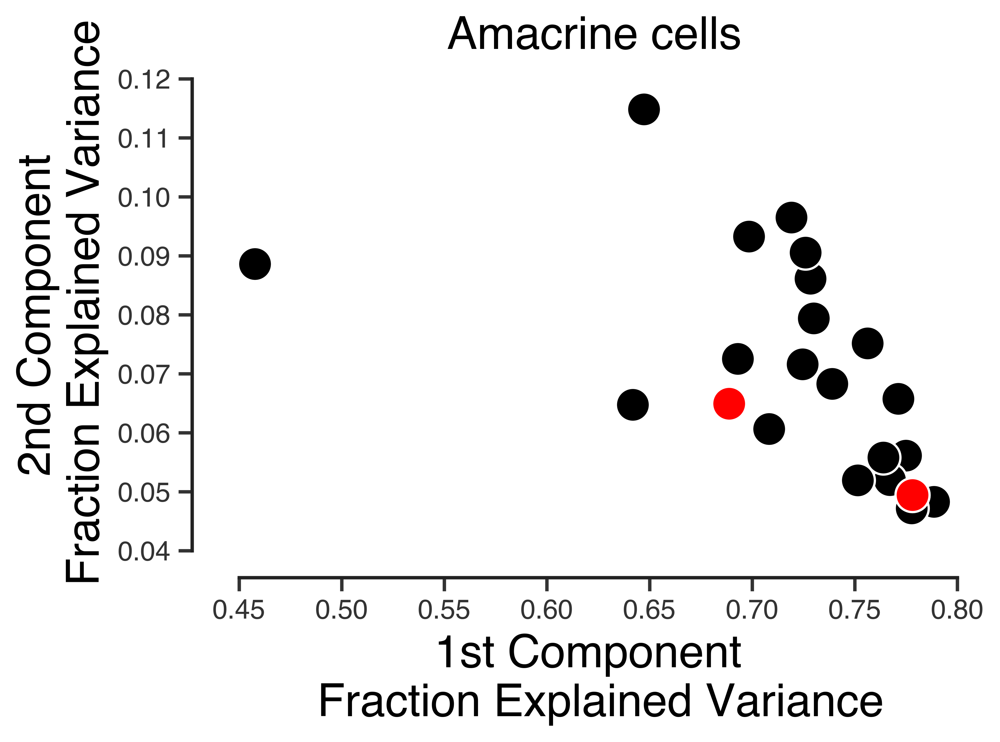

In [113]:
explained_variances = np.stack(explained_variances)
plt.scatter(explained_variances[:,0], explained_variances[:,1], color='k', edgecolor='w')
plt.scatter(explained_variances[21,0], explained_variances[21,1], color='r', edgecolor='w')
plt.scatter(explained_variances[18,0], explained_variances[18,1], color='r', edgecolor='w')
plt.xlabel('1st Component \n Fraction Explained Variance', fontsize=20)
plt.ylabel('2nd Component \n Fraction Explained Variance', fontsize=20)
plt.title('Amacrine cells', fontsize=20)
adjust_spines(plt.gca())

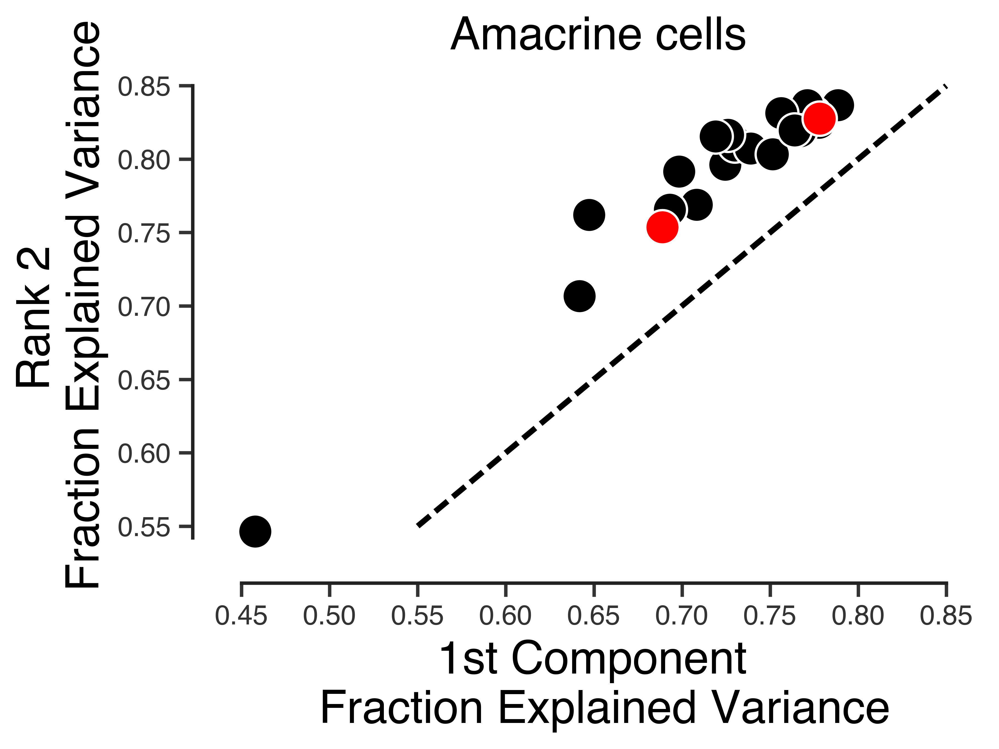

In [112]:
explained_variances = np.stack(explained_variances)
plt.scatter(explained_variances[:,0], np.sum(explained_variances, axis=1), color='k', edgecolor='w')
plt.scatter(explained_variances[21,0], np.sum(explained_variances[21]), color='r', edgecolor='w')
plt.scatter(explained_variances[18,0], np.sum(explained_variances[18]), color='r', edgecolor='w')
plt.plot(np.linspace(.55,.85,5), np.linspace(.55,.85,5), 'k--')
plt.xlabel('1st Component \n Fraction Explained Variance', fontsize=20)
plt.ylabel('Rank 2 \n Fraction Explained Variance', fontsize=20)
plt.title('Amacrine cells', fontsize=20)
adjust_spines(plt.gca())

## Now the same thing for horizontal cells

In [101]:
h_explained_variances = []
with h5py.File(data_dir + h_file, 'r') as f:
    keys = [str(k)[3:-2] for k in list(f['expts'])]
    for ide, expt in enumerate(keys):
#         print((ide, expt))
        rf = np.array(f['lines/rfs/%s' %expt])        
        pca = PCA(n_components=2)
        pca.fit(rf)
        
        h_explained_variances.append(pca.explained_variance_ratio_)
        
        # Get 1d rf
        g_pca = pca.components_[0]
        sign_of_pc = -1 * np.sign(g_pca[abs(g_pca) == np.max(abs(g_pca))])
        rf_1d = sign_of_pc * g_pca
        
        # Find space and interpolate the 1d rf
        this_space = get_space(rf_1d, interneuron_spacing, microns_per_degree, in_degrees=True, kind='peak')
        this_cell_interp = interp1d(this_space, rf_1d, kind='slinear', bounds_error=False, fill_value=[0])
        rf = this_cell_interp(space)
        
        proj_range = [np.exp(-abs(t)/space_constant[interneuron_type]) for t in np.linspace(np.min(space),
                                                                                        np.max(space),len(space))]
        proj_field = np.convolve(proj_range, rf, mode=conv_mode)
        proj_field *= np.mean(rf) / np.mean(proj_field)

        proj_space = get_space(proj_field, np.diff(space[:2]), microns_per_degree, in_degrees=False)
        component_interp = interp1d(proj_space, proj_field, kind='slinear', bounds_error=False, fill_value=[0])
        rf_component = component_interp(space)
        
        popt, pcov = curve_fit(gaussian, space, -rf_component, p0=[2.5, 0.0, 2.1])
        interneuron_fit = abs(popt[0])
        print((ide, expt, interneuron_fit))

(0, '090312_r1_c1', 6.6334529291799305)
(1, '092312_r1_c1', 9.050471331192977)
(2, '092312_r3_c1', 7.0563634623427314)
(3, '120212_r1_c1', 7.780894808714276)
(4, '121612_r2_c1', 5.8261616236171729)
(5, '122412_r1_c1', 5.1239707505607663)
(6, '122412_r2_c1', 5.8328489005578188)


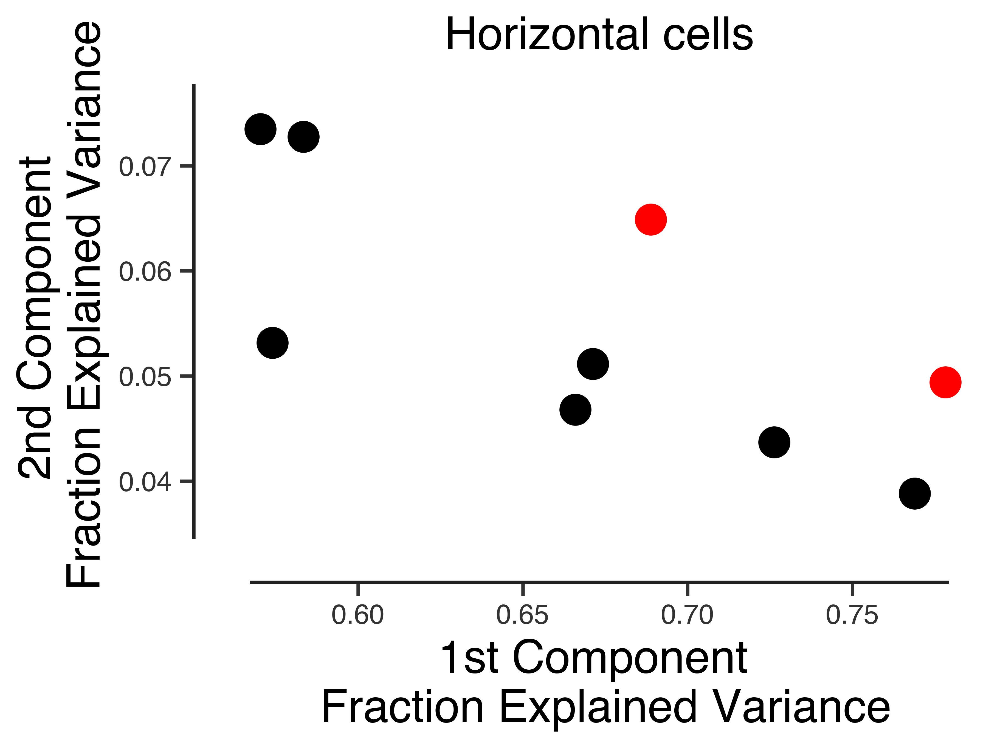

In [114]:
h_explained_variances = np.stack(h_explained_variances)
plt.scatter(h_explained_variances[:,0], h_explained_variances[:,1], color='k', edgecolor='w')
plt.scatter(explained_variances[21,0], explained_variances[21,1], color='r', edgecolor='w')
plt.scatter(explained_variances[18,0], explained_variances[18,1], color='r', edgecolor='w')
plt.xlabel('1st Component \n Fraction Explained Variance', fontsize=20)
plt.ylabel('2nd Component \n Fraction Explained Variance', fontsize=20)
plt.title('Horizontal cells', fontsize=20)
adjust_spines(plt.gca())

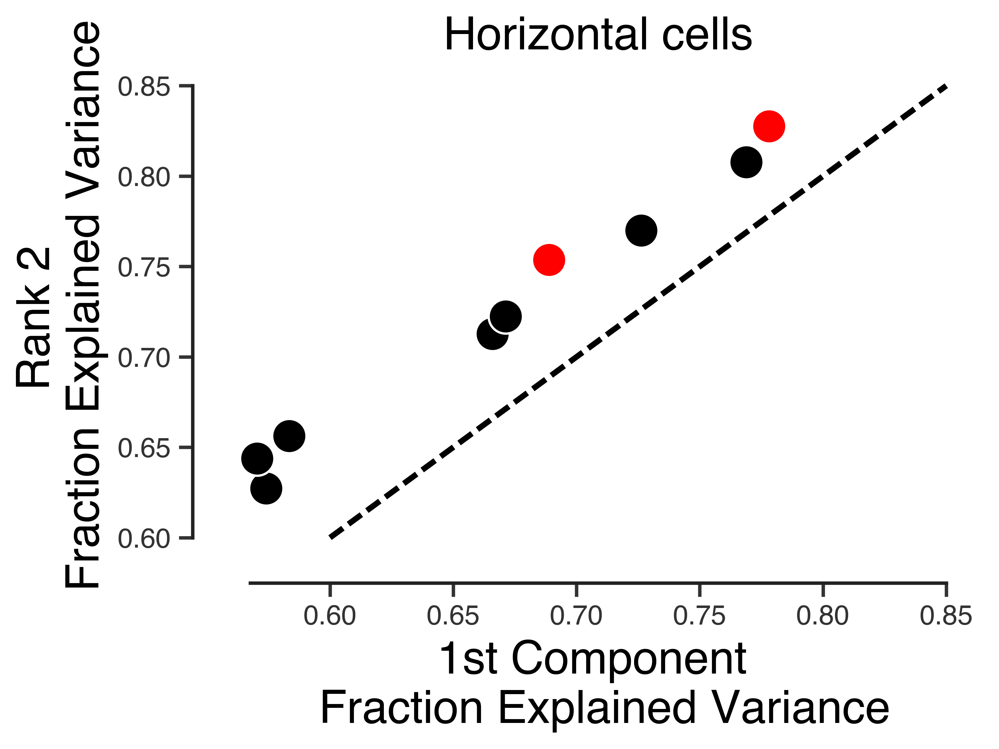

In [115]:
plt.scatter(h_explained_variances[:,0], np.sum(h_explained_variances, axis=1), color='k', edgecolor='w')
plt.scatter(explained_variances[21,0], np.sum(explained_variances[21]), color='r', edgecolor='w')
plt.scatter(explained_variances[18,0], np.sum(explained_variances[18]), color='r', edgecolor='w')
plt.plot(np.linspace(.6,.85,5), np.linspace(.6,.85,5), 'k--')
plt.xlabel('1st Component \n Fraction Explained Variance', fontsize=20)
plt.ylabel('Rank 2 \n Fraction Explained Variance', fontsize=20)
plt.title('Horizontal cells', fontsize=20)
adjust_spines(plt.gca())

### Compute receptive field components (RF convolved with Transmission Filter)

In [6]:
horz_pfs_full = get_horizontal_projective_field(conv_mode='full')
horz_pfs_same = get_horizontal_projective_field(conv_mode='same')
ama_pfs_full = get_amacrine_projective_field(conv_mode='full')
ama_pfs_same = get_amacrine_projective_field(conv_mode='same')

space_h_full, horz_pf_full, horz_sem_full = get_mean(horz_pfs_full)
space_h_same, horz_pf_same, horz_sem_same = get_mean(horz_pfs_same)
space_a_full, ama_pf_full, ama_sem_full = get_mean(ama_pfs_full)
space_a_same, ama_pf_same, ama_sem_same = get_mean(ama_pfs_same)

In [7]:
horz_pf_interp = interp1d(space_h_full, horz_pf_full, kind='slinear', bounds_error=False, fill_value=[0])
ama_pf_interp = interp1d(space_a_full, ama_pf_full, kind='slinear', bounds_error=False, fill_value=[0])

horz_pf = horz_pf_interp(space)
ama_pf = ama_pf_interp(space)

In [8]:
space_constant = {
    'horizontal': 116./microns_per_degree,
    'amacrine': 80./microns_per_degree
    }

conv_mode = 'full'

rf_components = collections.defaultdict(list)
for interneuron_type in receptive_fields.keys():
    if interneuron_type in ['horizontal', 'amacrine']:
        for rf in receptive_fields[interneuron_type]:
            proj_range = [np.exp(-abs(t)/space_constant[interneuron_type]) for t in np.linspace(np.min(space),
                                                                                        np.max(space),len(space))]
            proj_field = np.convolve(proj_range, rf, mode=conv_mode)
            proj_field *= np.mean(rf) / np.mean(proj_field)

            proj_space = get_space(proj_field, np.diff(space[:2]), microns_per_degree, in_degrees=False)
            component_interp = interp1d(proj_space, proj_field, kind='slinear', bounds_error=False, fill_value=[0])
            rf_components[interneuron_type].append(component_interp(space))
        
interneuron_fits = collections.defaultdict(list)
for interneuron_type in rf_components.keys():
    for component in rf_components[interneuron_type]:
        popt, pcov = curve_fit(gaussian, space, -component, p0=[2.5, 0.0, 2.1])
        interneuron_fits[interneuron_type].append(abs(popt[0]))

# Figure 2 A, B

In [9]:
common_x_start = -1.25
common_x_end = 1.25

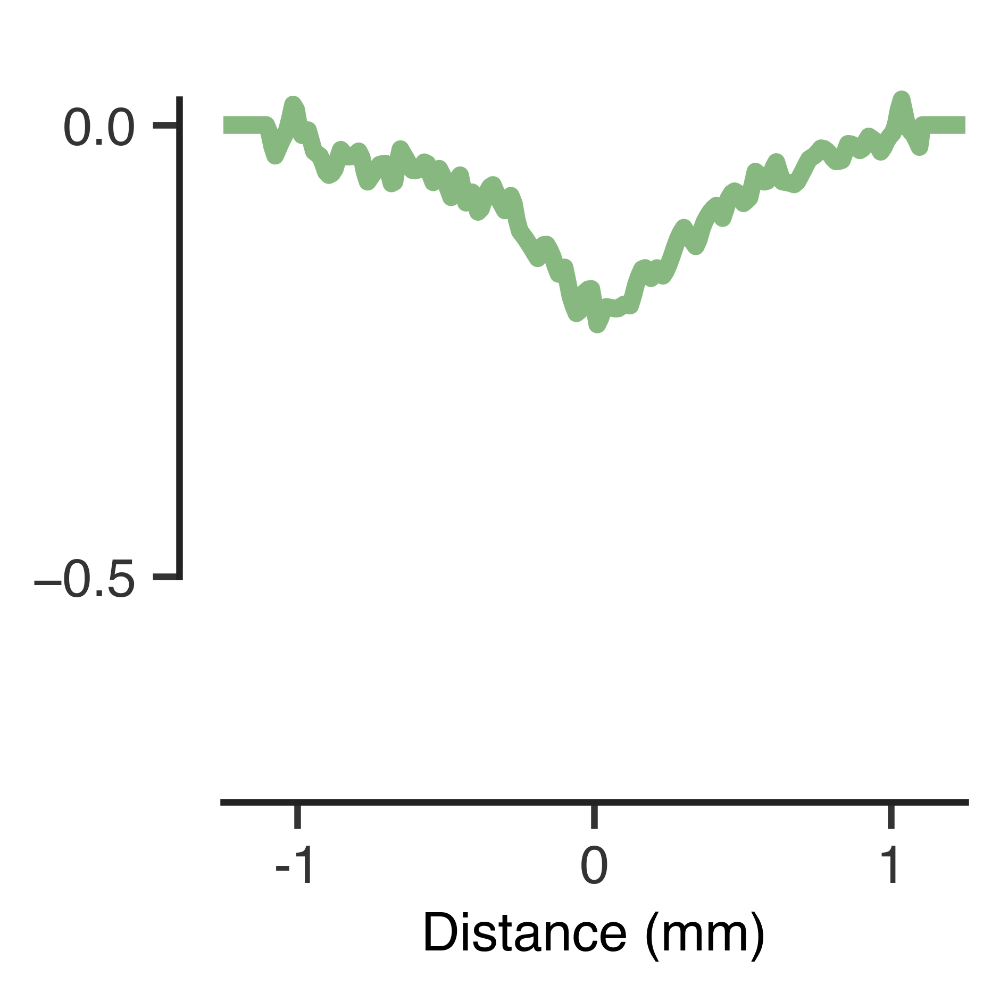

In [10]:
# going to convert space in degrees to mm
# so space * microns/degree * mm/microns
fig = plt.gcf()
fig.set_size_inches((3,3))
# old green was 47B224
plt.plot(space * microns_per_degree / 1000., receptive_fields['horizontal'][1], color='#0F7201', 
         alpha=0.5, linewidth=4)

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(minorLocator)
# ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator)

# plt.plot([-0.6, -0.9], [-.4, -.4], 'k')
# plt.text(-1.03, -.48, '300 $\mu$m', fontsize=12)


plt.ylim(-.7, 0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('horizontal receptive field.png', transparent=True)

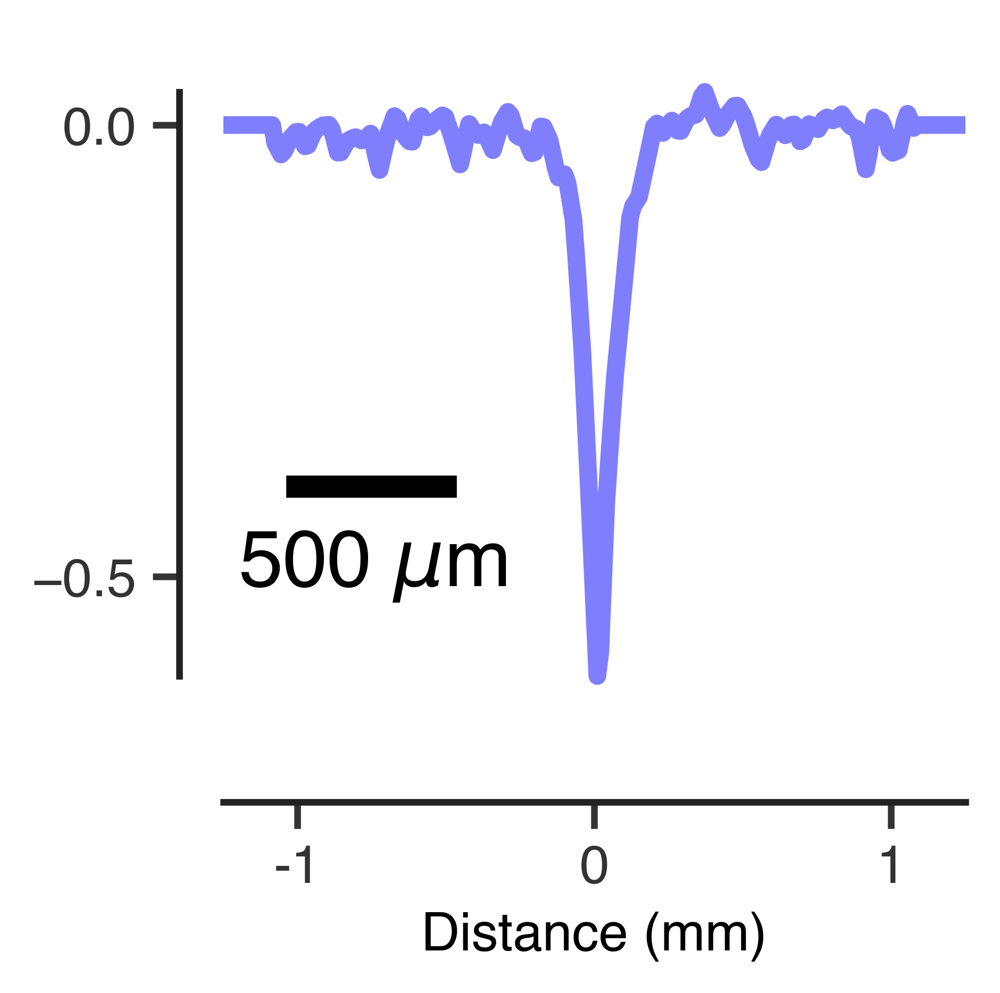

In [11]:
# going to convert space in degrees to mm
# so space * microns/degree * mm/microns
fig = plt.gcf()
fig.set_size_inches((3,3))
plt.plot(space * microns_per_degree / 1000., receptive_fields['amacrine'][0], color='#0000FE', 
         alpha=0.5, linewidth=4)

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(minorLocator)
# ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator)

plt.plot([-1.0, -0.5], [-.4, -.4], 'k', linewidth=5)
plt.text(-1.2, -.51, '500 $\mu$m', fontsize=18)


plt.ylim(-.7, 0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('amacrine receptive field.png', transparent=True)

## Mean amacrine & horizontal RFs

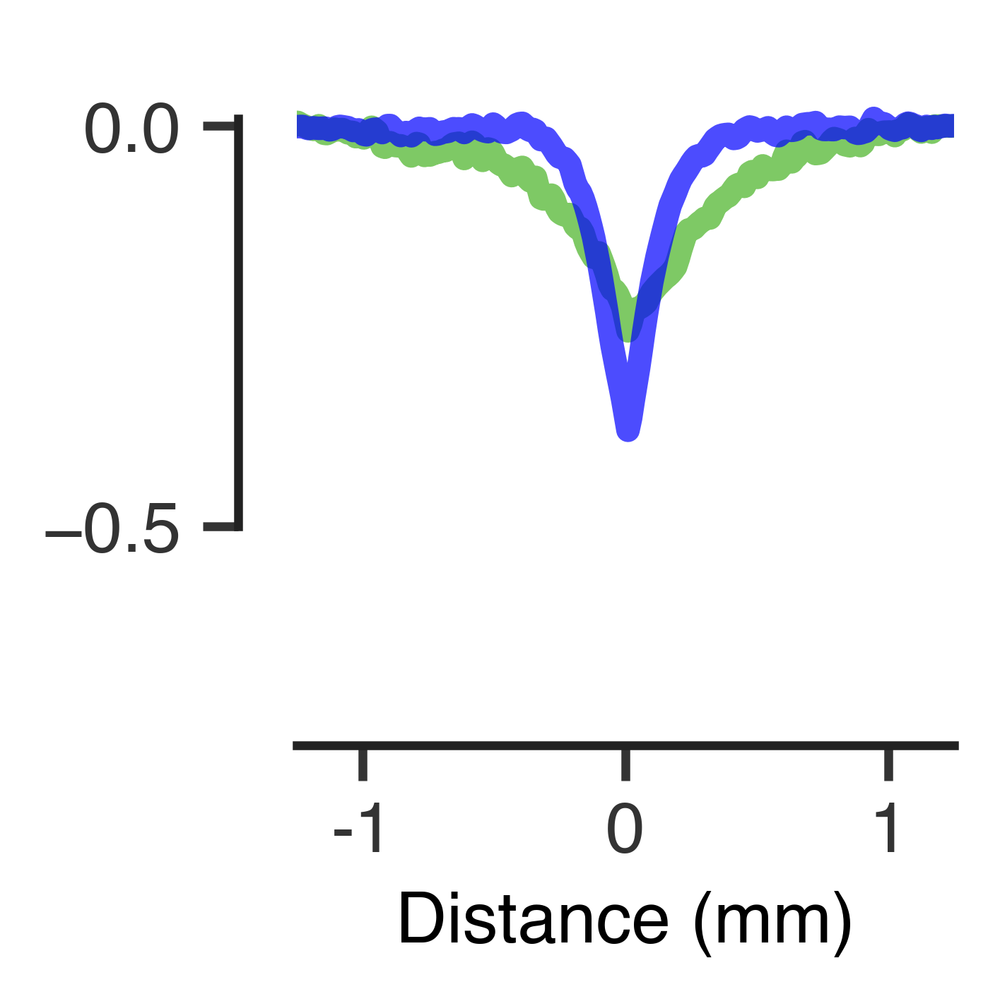

In [12]:
# going to convert space in degrees to mm
# so space * microns/degree * mm/microns
fig = plt.gcf()
fig.set_size_inches((2,2))
plt.plot(space * microns_per_degree / 1000., np.mean(receptive_fields['horizontal'], axis=0), color='#47B224', 
         alpha=0.7, linewidth=4)
plt.plot(space * microns_per_degree / 1000., np.mean(receptive_fields['amacrine'], axis=0), color='#0000FE', 
         alpha=0.7, linewidth=4)

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(minorLocator)
# ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-.7, 0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

# Figure 2 E, F

Previously as the horizontal component I was using the average horizontal component from the 2 horizontal cells that David gave me originally. Let's use the average of all the horizontal cells now.

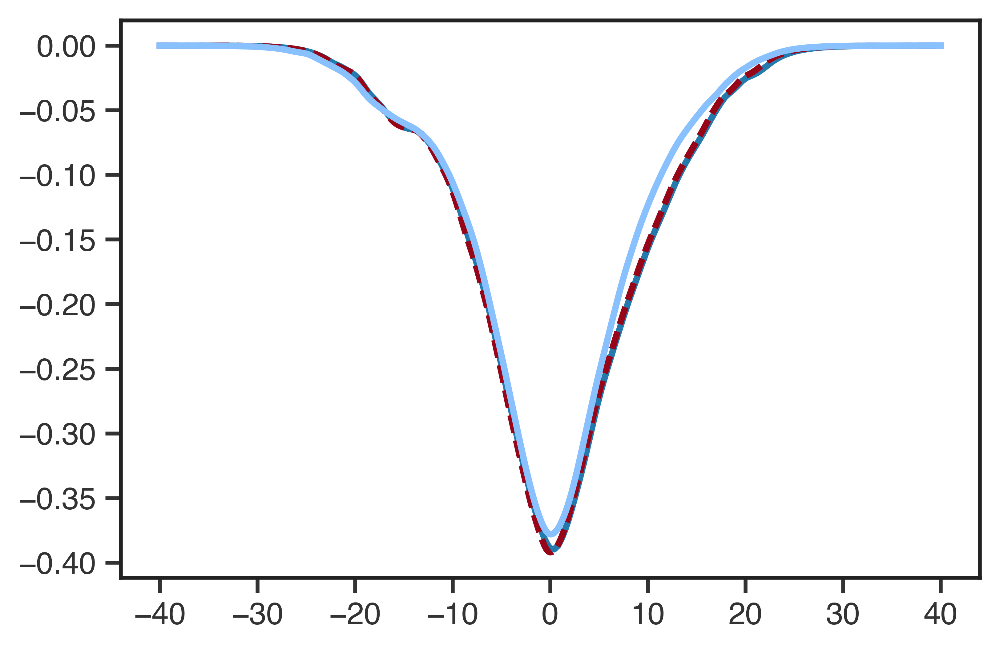

In [13]:
plt.plot(space, horz_pf)
plt.plot(space, np.mean([rf_components['horizontal'][0], rf_components['horizontal'][1]], axis=0), '--')
plt.plot(space, np.mean(rf_components['horizontal'], axis=0), color='#89C0FE')

Same thing for amacrine cell contribution

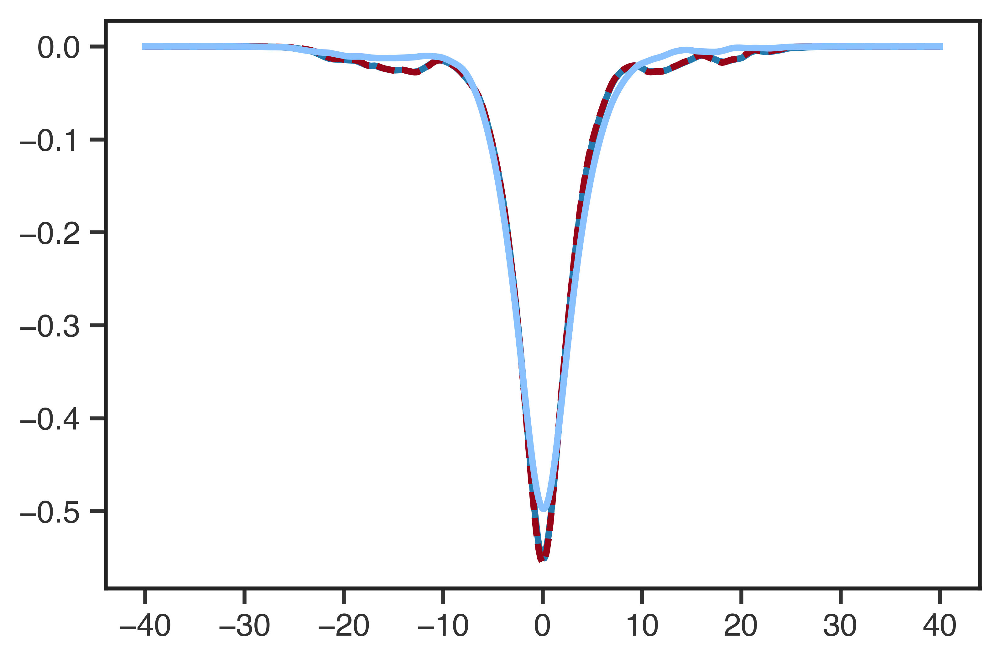

In [14]:
plt.plot(space, ama_pf)
plt.plot(space, np.mean([rf_components['amacrine'][0], rf_components['amacrine'][1]], axis=0), '--')
plt.plot(space, np.mean(rf_components['amacrine'], axis=0), color='#89C0FE')

## For the ganglion cell surround, let's use the horizontal + amacrine cell component fit from the linear model we use later on

### Model of Horizontal Projective Field + Amacrine Projective Field + Center

In [15]:
old_horz_pf = horz_pf.copy()
old_ama_pf = ama_pf.copy()

horz_pf = np.mean(rf_components['horizontal'], axis=0)
ama_pf = np.mean(rf_components['amacrine'], axis=0)

horz_pf /= np.sum(horz_pf)
ama_pf /= np.sum(ama_pf)

### Get center widths for each ganglion cell

In [16]:
diff_of_gauss_mu0 = partial(difference_of_gaussians, mu=0)

In [17]:
def center_and_surround(space, center_width, surround_width, center_strength, surround_strength):
    return diff_of_gauss_mu0(space, abs(center_width), abs(surround_width),
                            -abs(center_strength), abs(surround_strength))

In [18]:
center_widths = collections.defaultdict(list)
surround_widths = collections.defaultdict(list)
center_strengths = collections.defaultdict(list)
surround_strengths = collections.defaultdict(list)
fit_failures = collections.defaultdict(list)

celltype = 'ganglion'        
for idg, g in tqdm(enumerate(receptive_fields[celltype])):
    try:
        popt_this, pcov = curve_fit(center_and_surround, space, g, p0=[1.5, 3.5, -10, 30])
        center_id = np.argmin(abs(popt_this[:2]))
        surround_id = 1 ^ center_id
        center_widths[celltype].append(abs(popt_this[center_id]))
        surround_widths[celltype].append(abs(popt_this[surround_id]))
        center_strengths[celltype].append(popt_this[center_id+2])
        surround_strengths[celltype].append(popt_this[surround_id+2])
#                 plt.plot(space, diff_of_gauss_mu0(space, *popt_this), color=np.random.rand(3), alpha=0.6)
    except:
        fit_failures[celltype].append(idg)

        # just set params to median across cells
        # this way the params are still aligned with the receptive field id
        center_widths[celltype].append(np.median(center_widths[celltype]))
        surround_widths[celltype].append(np.median(surround_widths[celltype]))
        center_strengths[celltype].append(np.median(center_strengths[celltype]))
        surround_strengths[celltype].append(np.median(surround_strengths[celltype]))

        print("Couldn't fit cell %d" %idg)

14it [00:03,  1.49it/s]

Couldn't fit cell 13


22it [00:08,  1.65it/s]

Couldn't fit cell 14
Couldn't fit cell 20


31it [00:11,  1.83it/s]

Couldn't fit cell 29


60it [00:14,  4.28it/s]


Plot the average profile across celltypes

In [19]:
cws = np.array(center_widths[celltype])
sws = np.array(surround_widths[celltype])
css = np.array(center_strengths[celltype])
sss = np.array(surround_strengths[celltype])
#     mean_center_widths[celltype] = np.mean(cws[cws < 500])
#     mean_surround_width = np.mean(sws[sws < 500])
#     mean_center_strength = np.mean(css[abs(css) < 500])
#     mean_surround_strength = np.mean(sss[abs(sss) < 500])
    
median_center_width = np.median(abs(cws))
median_surround_width = np.median(abs(sws))
median_center_strength = np.median(-abs(css))
median_surround_strength = np.median(abs(sss))
#     plt.plot(space, diff_of_gauss_mu0(space, median_center_widths[celltype], median_surround_width,
#                                      median_center_strength, median_surround_strength), label=celltype)
# plt.legend(frameon=False, fontsize=9, loc='lower left')
# adjust_spines(plt.gca())

In [20]:
median_center_width

1.5412231316122997

In [21]:
median_surround_width

7.4512765025349808

Bar charts to visualize diversity

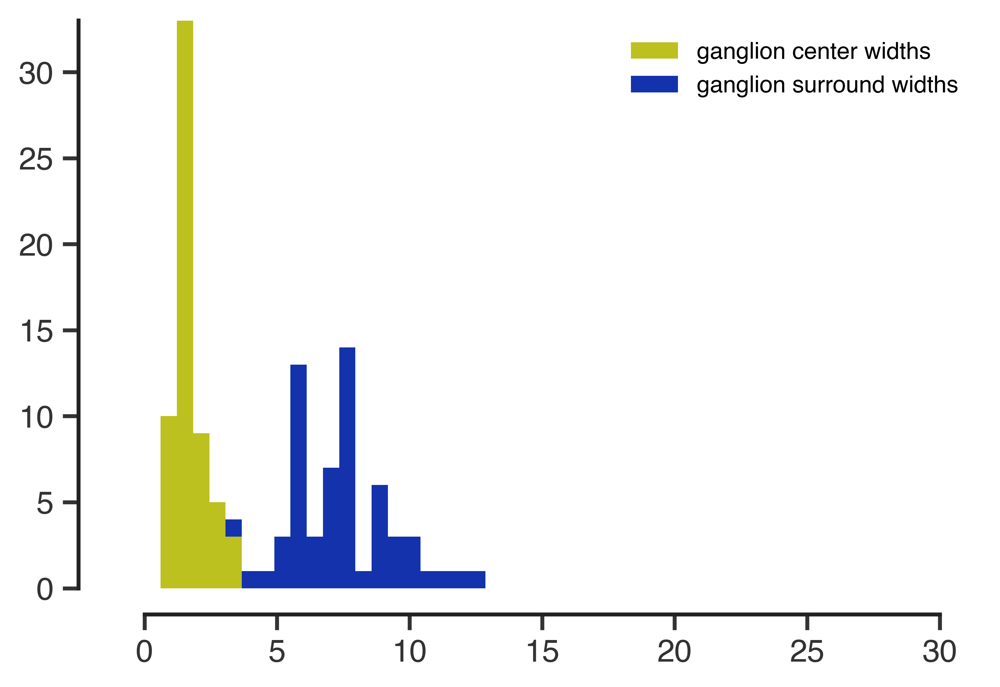

In [22]:
cws = np.array(center_widths[celltype])
sws = np.array(surround_widths[celltype])
# bins = np.linspace(np.min([cws]), np.max(sws[sws < 200]), 50)
bins = np.linspace(0,30,50)
counts, bins = np.histogram(cws[cws < 500], bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s center widths' %celltype)

counts_surr, bins_surr = np.histogram(sws[sws < 500], bins=bins)
plt.bar(bins[:-1]+np.mean(np.diff(bins))/2, counts_surr, width=np.mean(np.diff(bins)), color=np.random.rand(3),
       label='%s surround widths' %celltype, bottom=counts)

adjust_spines(plt.gca())
plt.legend(frameon=False, fontsize=9)

### Now use this center width to fit the full model to each ganglion cell

In [23]:
iterations = 100

fits = collections.defaultdict(list)
mean_squared_errors = collections.defaultdict(list)
abs_errors = collections.defaultdict(list)
variances = collections.defaultdict(list)
surrounds = collections.defaultdict(list)
normed_rfs = collections.defaultdict(list)
                
popts = []

for i,rf in tqdm(enumerate(receptive_fields[celltype])):
    center = gaussian(x=space, sigma=center_widths[celltype][i], mu=0.)
    center /= -np.sum(center) # make center unit vector like horz_pf and ama_pf

    def rf_model(horz_weight, center_weight):
        horz_weight = np.min([1.0, abs(horz_weight)])
        center_weight = np.min([1.0, abs(center_weight)])
        return center_weight*center + (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)
    
    def surround(horz_weight, center_weight):
        horz_weight = np.min([1.0, abs(horz_weight)])
        center_weight = np.min([1.0, abs(center_weight)])
        return (1-center_weight)*(horz_weight*horz_pf + (1-horz_weight)*ama_pf)

    def model_error_to_ganglion_cells(weights):
        hw, cw = weights
        modeled_rf = rf_model(hw, cw)
        normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
        return sum(abs(normed_rf - rf))

    best_fit_err = np.inf
    for itr in range(iterations):
        this_popt = minimize(model_error_to_ganglion_cells, np.random.rand(2))
        if this_popt.fun < best_fit_err:
            best_fit_err = this_popt.fun
            popt = this_popt

    # get mean squared error
    modeled_rf = rf_model(*popt.x)
    normed_rf = np.max(abs(rf))*modeled_rf/np.max(abs(modeled_rf))
    mse = np.mean((normed_rf - rf)**2)

    # truncate params between 0 and 1
#             x = np.where(popt.x < 0, 0, popt.x) # this actually is wrong, since I'm abs(params) in rf_model
#             x = np.where(x > 1, 1, x)
    hw = np.min([1.0, abs(popt.x[0])])
    cw = np.min([1.0, abs(popt.x[1])])

    popts.append(np.array([hw, cw]))
    abs_errors[celltype].append(popt.fun)
    mean_squared_errors[celltype].append(mse)
    variances[celltype].append(np.var(rf))
    surrounds[celltype].append(surround(hw, cw))
    normed_rfs[celltype].append(normed_rf)

fits[celltype] = np.stack(popts)

60it [03:25,  3.38s/it]


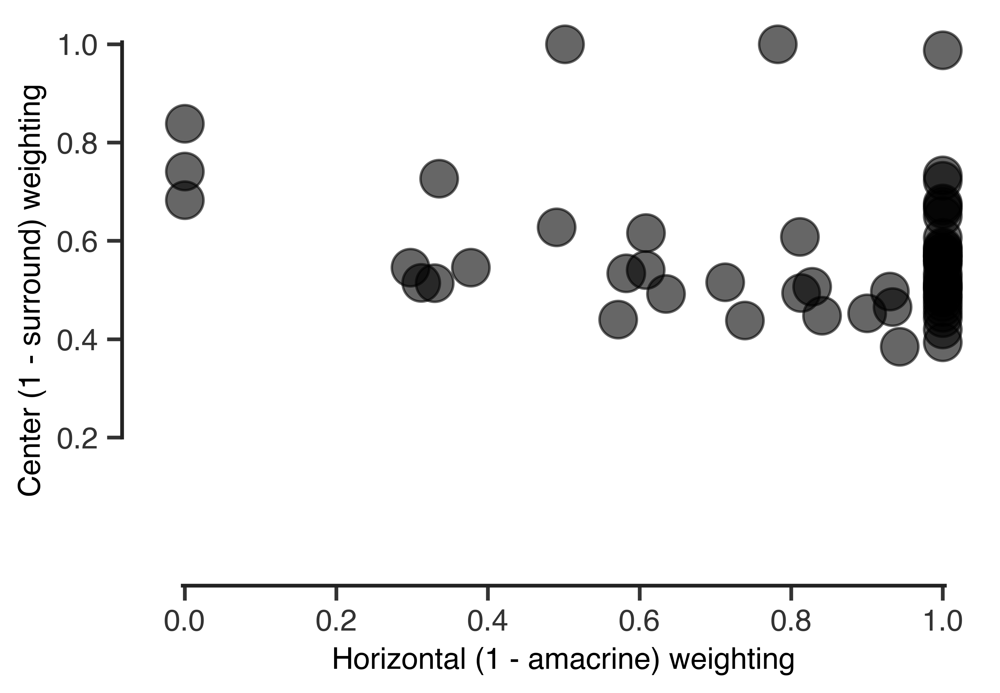

In [24]:
plt.scatter(fits[celltype][:,0], fits[celltype][:,1], c='k', alpha=0.6)
plt.xlim(-0.05,1.05)
plt.ylim(-0.05,1.05)
adjust_spines(plt.gca())
plt.xlabel('Horizontal (1 - amacrine) weighting')
plt.ylabel('Center (1 - surround) weighting')

In [25]:
fits['ganglion'][:,1]

array([ 0.56764558,  0.60643726,  0.48530637,  0.5835918 ,  0.54574789,
        0.46576044,  0.55973275,  0.44286975,  0.46559462,  0.49237037,
        0.67614192,  0.66444366,  0.61600062,  0.98758724,  1.        ,
        0.83828608,  0.74136188,  0.73304871,  0.68310143,  0.72661082,
        1.        ,  0.53432954,  0.45273267,  0.50658854,  0.72224329,
        0.4758985 ,  0.49422844,  0.65045082,  0.44023826,  0.50438107,
        0.52495646,  0.49698028,  0.51035831,  0.50140607,  0.51493237,
        0.54553082,  0.5516084 ,  0.57048808,  0.54087567,  0.44785506,
        0.57818451,  0.50648542,  0.67057804,  0.55955704,  0.51462902,
        0.43818364,  0.62787013,  0.51597016,  0.60814427,  0.51381491,
        0.38500569,  0.41973537,  0.49039438,  0.39396246,  0.45423129,
        0.57490147,  0.53322919,  0.58724503,  0.56834955,  0.5702714 ])

Take a look at the cells identified as monophasic

(-44.0, 44.0, -0.47640949947120426, 0.096999723748179612)

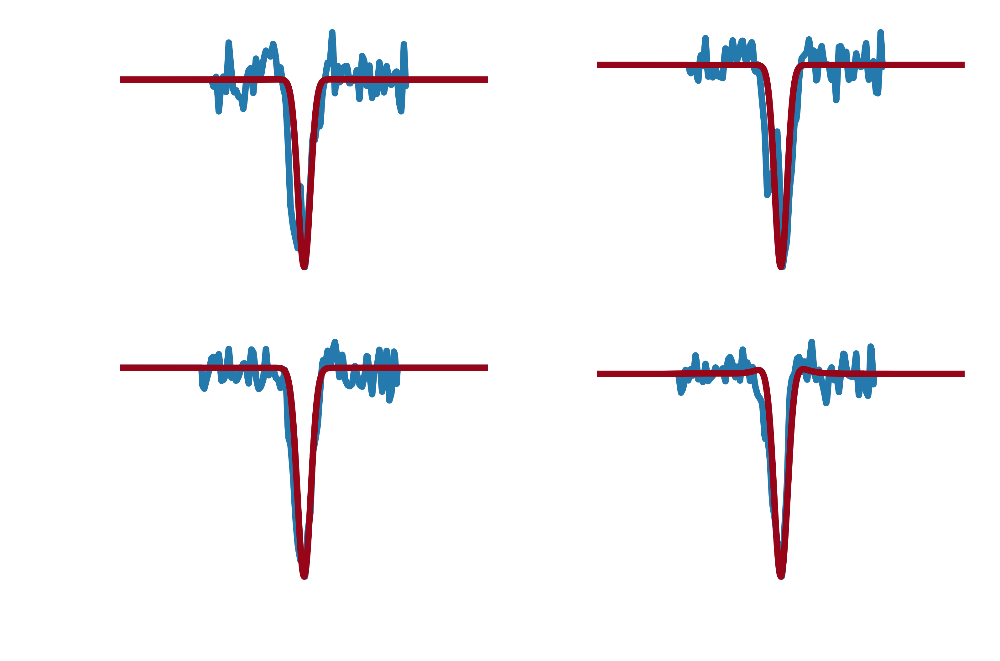

In [26]:
plt.subplot(2,2,1)
plt.plot(space, receptive_fields['ganglion'][13])
plt.plot(space, normed_rfs['ganglion'][13])
# plt.plot(space, surrounds['ganglion'][13])
plt.axis('off')

plt.subplot(2,2,2)
plt.plot(space, receptive_fields['ganglion'][14])
plt.plot(space, normed_rfs['ganglion'][14])
plt.axis('off')

plt.subplot(2,2,3)
plt.plot(space, receptive_fields['ganglion'][20])
plt.plot(space, normed_rfs['ganglion'][20])
plt.axis('off')

plt.subplot(2,2,4)
plt.plot(space, receptive_fields['ganglion'][15])
plt.plot(space, normed_rfs['ganglion'][15])
plt.axis('off')


## Now we can plot the amacrine, horizontal components against the ganglion surround

#### Horizontal

In [27]:
fits['ganglion'][9]

array([ 0.63483607,  0.49237037])

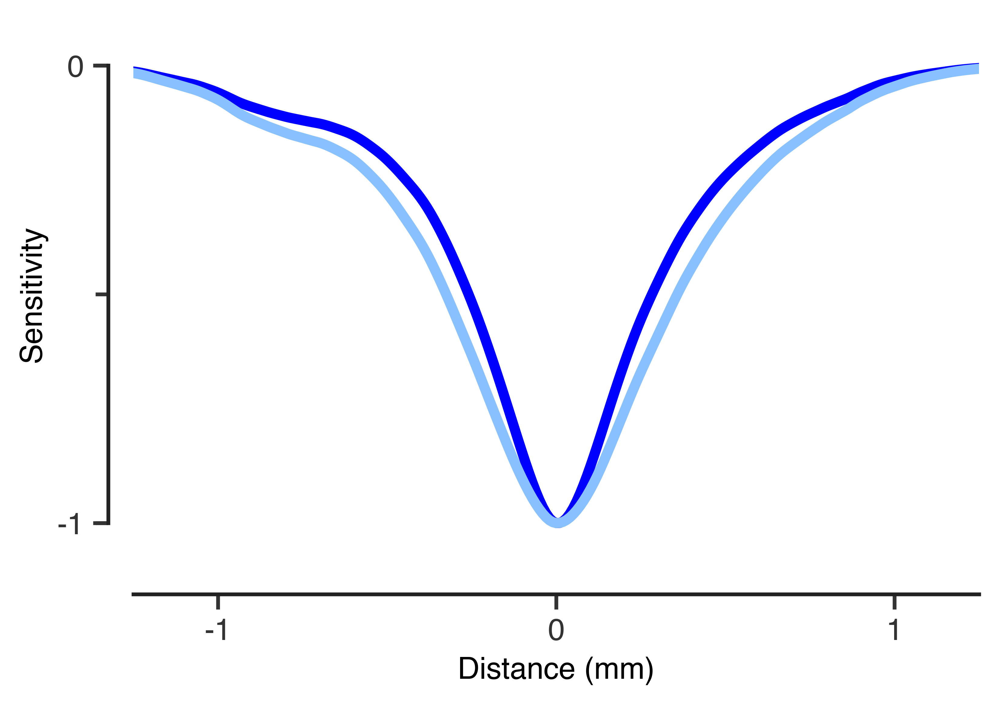

In [28]:
ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]


plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', linewidth=4)
plt.plot(space*microns_per_degree/1000., -horz_pf/np.max(abs(horz_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

#### Amacrine

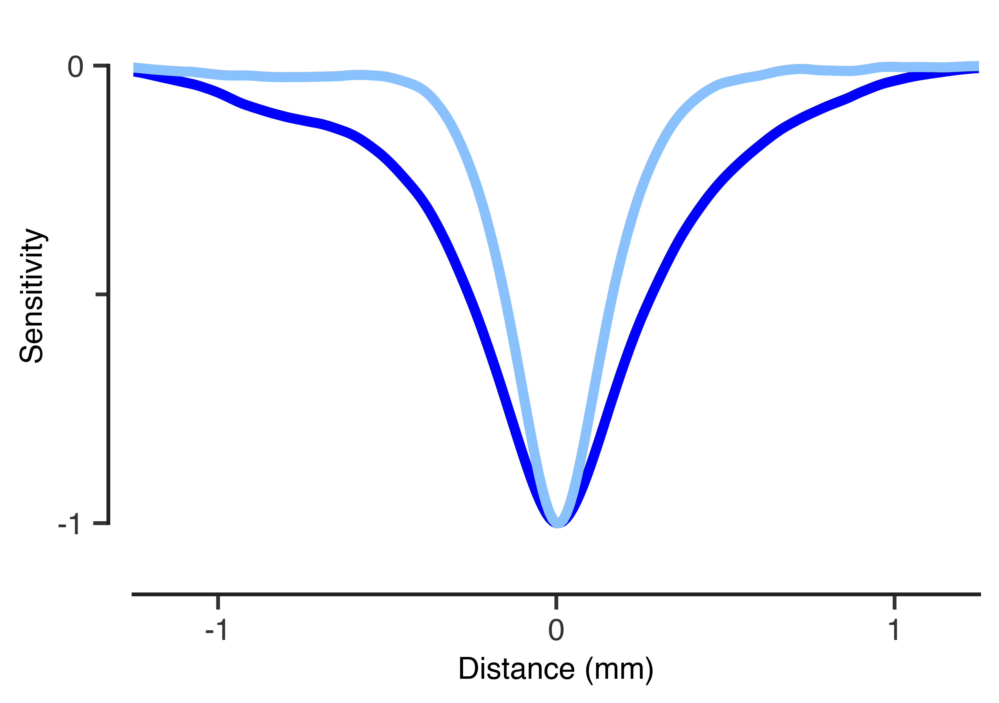

In [29]:
ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]


plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', linewidth=4)
plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

### Example plots with a single ganglion surround that has both amacrine and horizontal surround

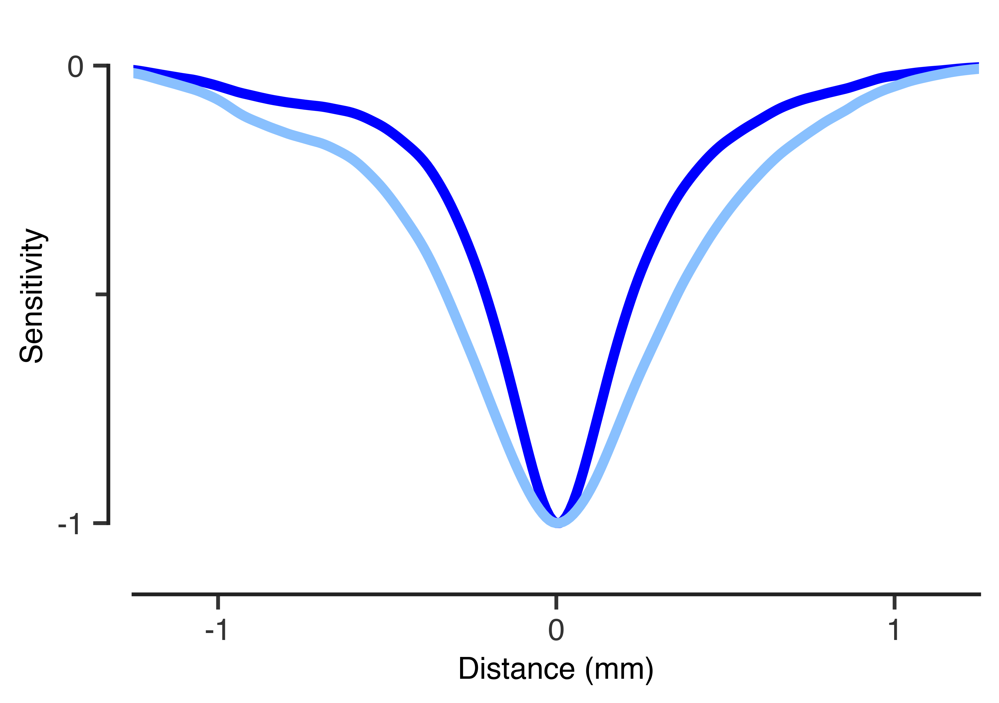

In [30]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
ganglion_surround = surrounds['ganglion'][9]


plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', linewidth=4)
plt.plot(space*microns_per_degree/1000., -horz_pf/np.max(abs(horz_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

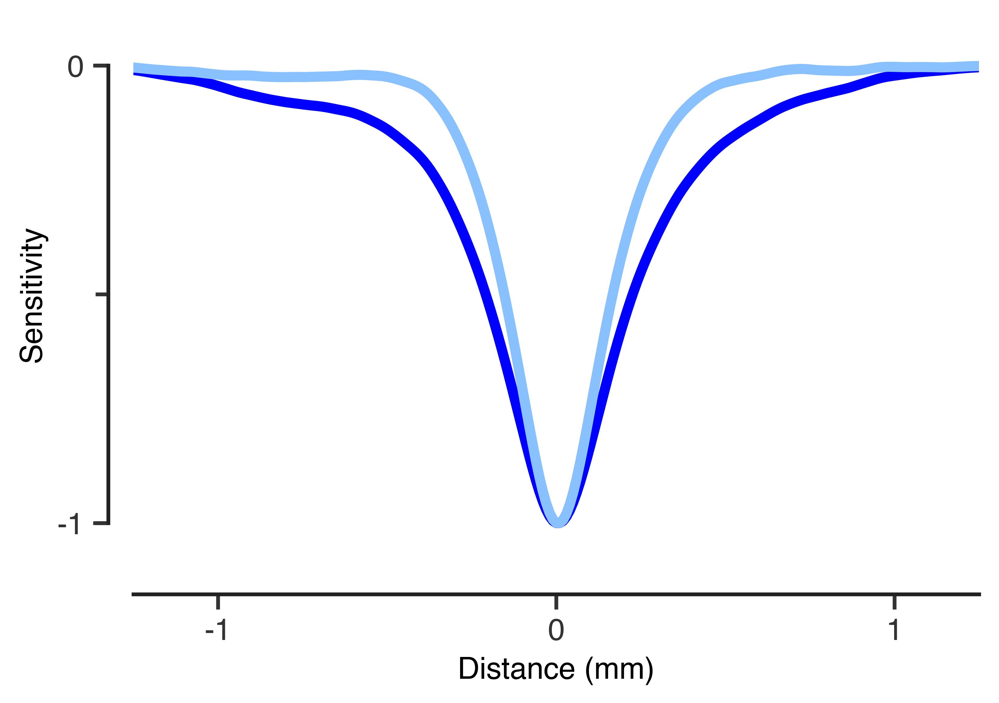

In [31]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
ganglion_surround = surrounds['ganglion'][9]


plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', linewidth=4)
plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('amacrine and ganglion surrounds - example 9.png', )

#### Try plotting all ganglion surrounds

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in true_divide


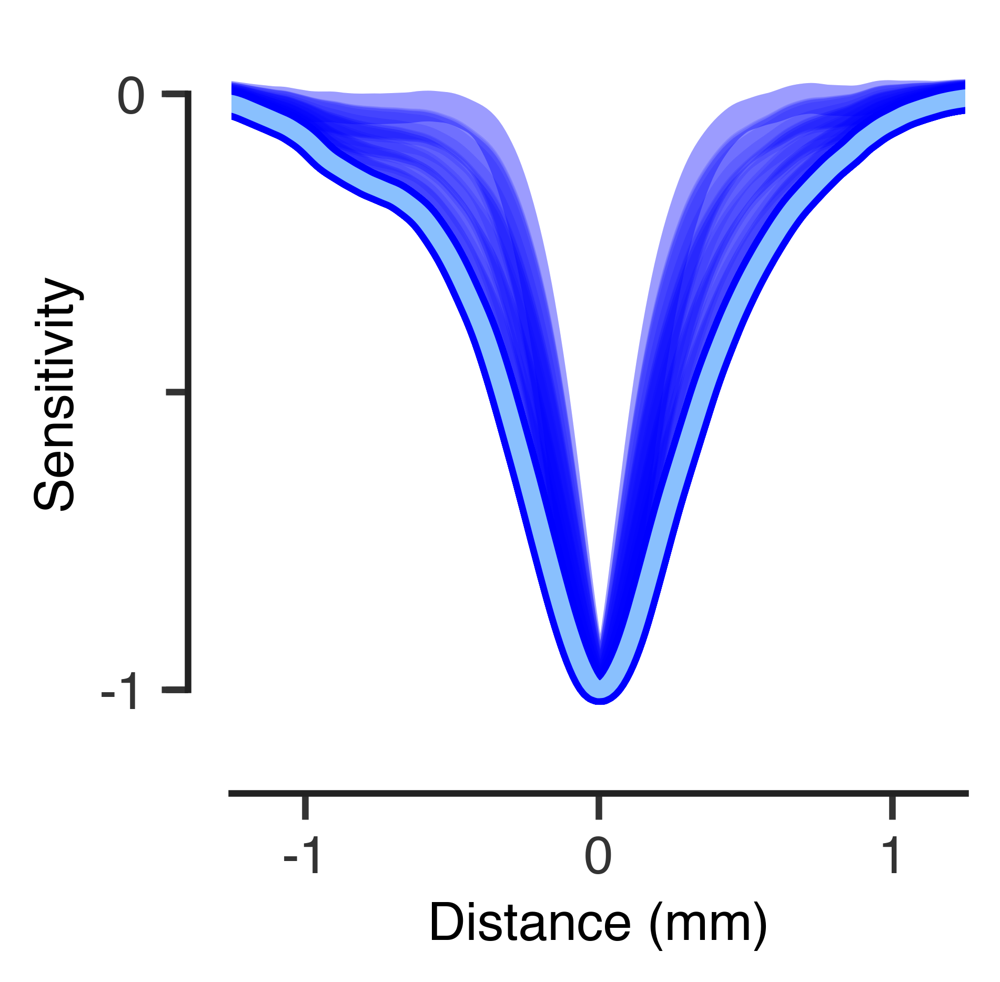

In [32]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]
fig = plt.gcf()
fig.set_size_inches((3,3))

for ganglion_surround in surrounds['ganglion']:
    plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', 
             linewidth=7, alpha=0.15)
plt.plot(space*microns_per_degree/1000., -horz_pf/np.max(abs(horz_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('horizontal pop pred with all ganglion surrounds square.png', transparent=True)

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in true_divide


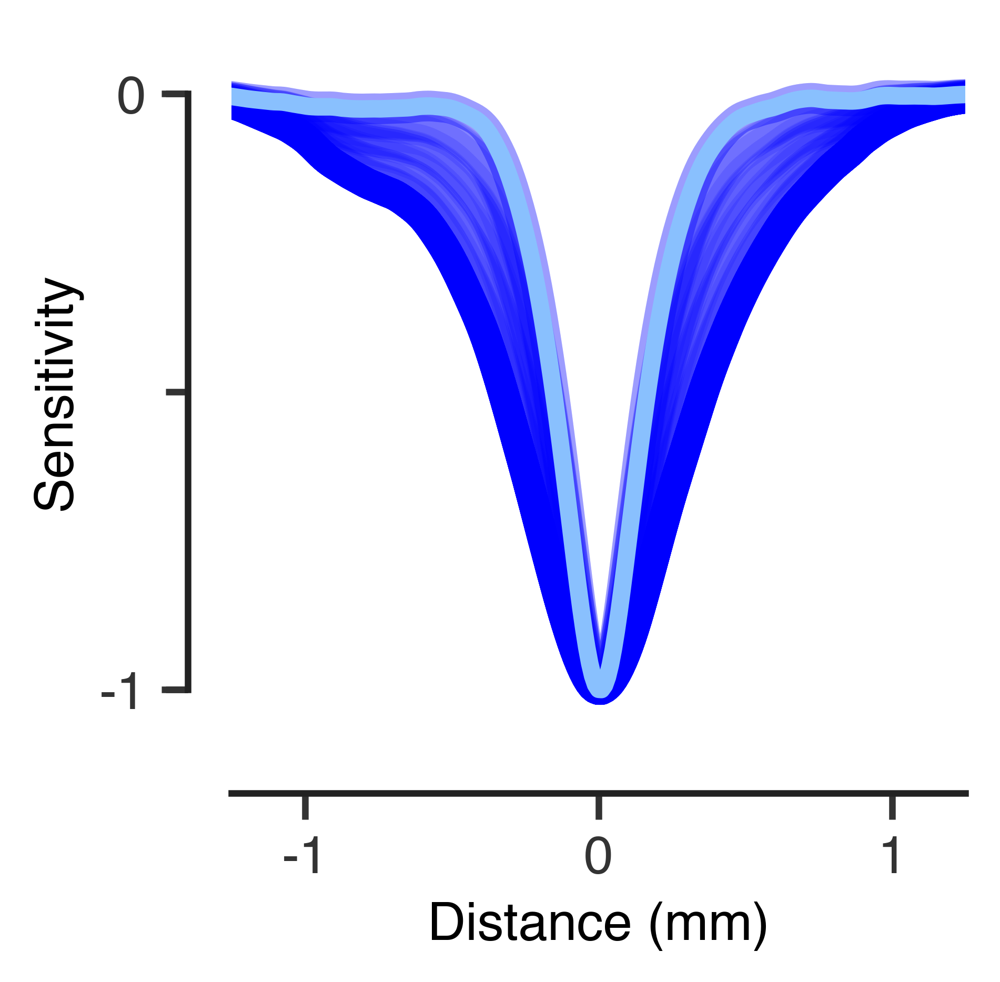

In [33]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]
fig = plt.gcf()
fig.set_size_inches((3,3))

for ganglion_surround in surrounds['ganglion']:
    plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', 
             linewidth=7, alpha=0.15)
plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('amacrine pop pred with all ganglion surrounds square.png', transparent=True)

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in true_divide


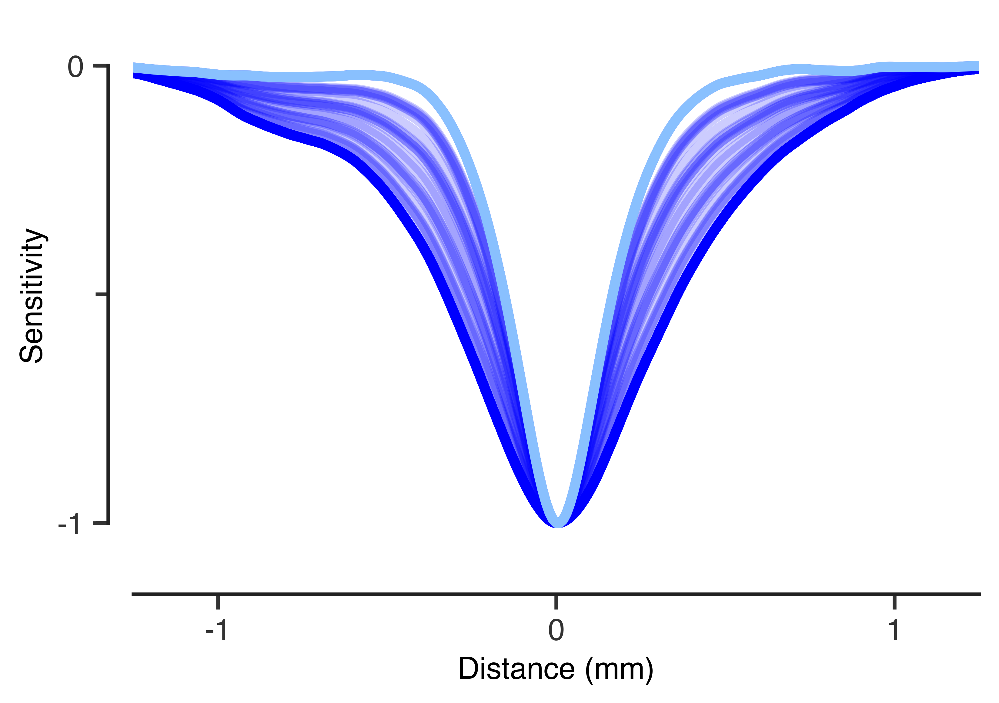

In [34]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]

tmp = []
for ganglion_surround in surrounds['ganglion']:
    if np.sum([np.array_equal(ganglion_surround.astype('float16'), t) for t in tmp]) < 1:
        plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#0000FE', 
                 linewidth=4, alpha=0.2)
        tmp.append(ganglion_surround.astype('float16'))
plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#89C0FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)



plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

In [35]:
from scipy.stats import pearsonr

In [36]:
cc_matrix = np.zeros((60,60))
for i,s1 in enumerate(surrounds['ganglion']):
    for j,s2 in enumerate(surrounds['ganglion']):
        cc_matrix[i,j] = pearsonr(s1, s2)[0]

/home/lane/.local/lib/python3.5/site-packages/scipy/stats/stats.py:3021: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


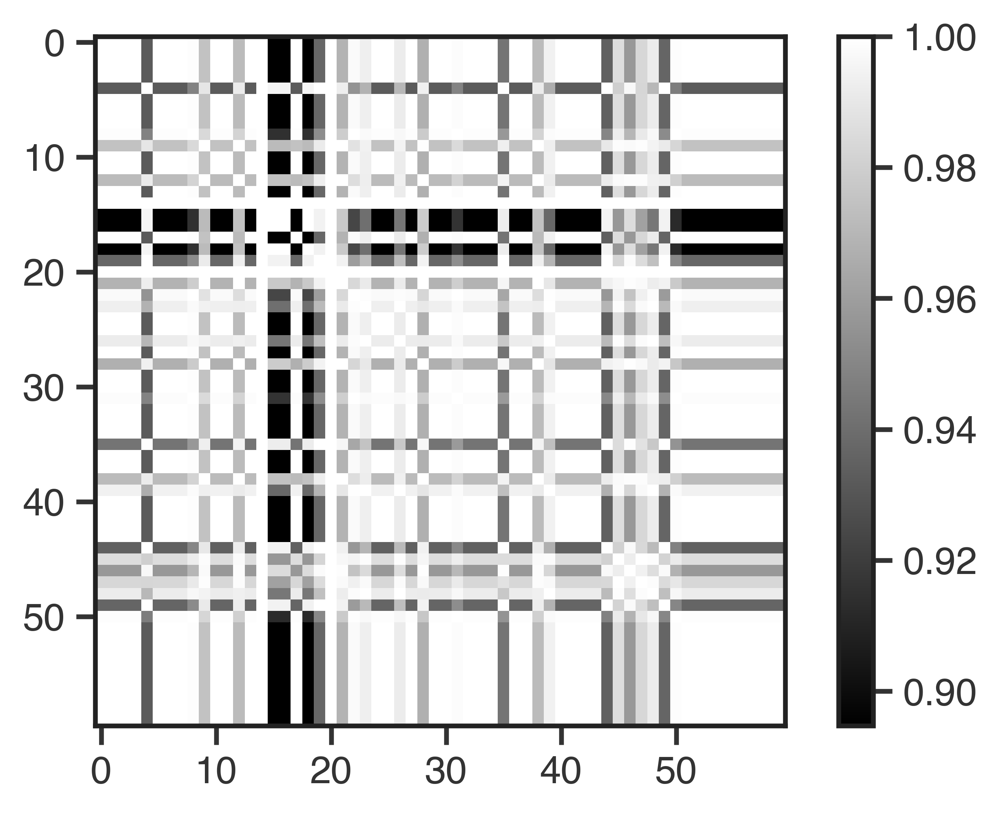

In [37]:
plt.imshow(cc_matrix)
plt.colorbar()

In [38]:
# [np.min(g) for g in surrounds['ganglion']]

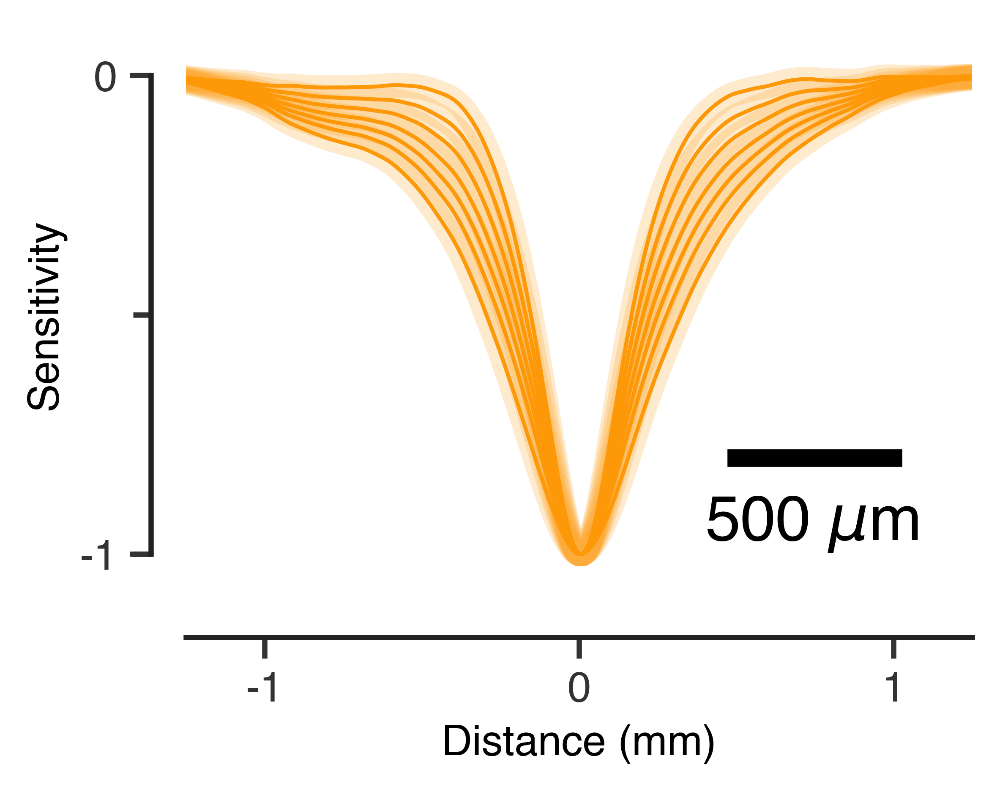

In [39]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]

fig = plt.gcf()
fig.set_size_inches((4,3))

for i,ganglion_surround in enumerate(surrounds['ganglion']):
    if np.min(ganglion_surround) != 0.0:
        if i > 0:
            if np.nanmax(cc_matrix[i,:i]) < 0.9995:
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=1.1, alpha=1)
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=7, alpha=0.2)
# plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#0000FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

plt.plot([0.5, 1.0], [-.8, -.8], 'k', linewidth=5)
plt.text(0.4, -.97, '500 $\mu$m', fontsize=18)


plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('amacrine component with ganglion surrounds and thick thin lines without prediction.png', transparent=True)

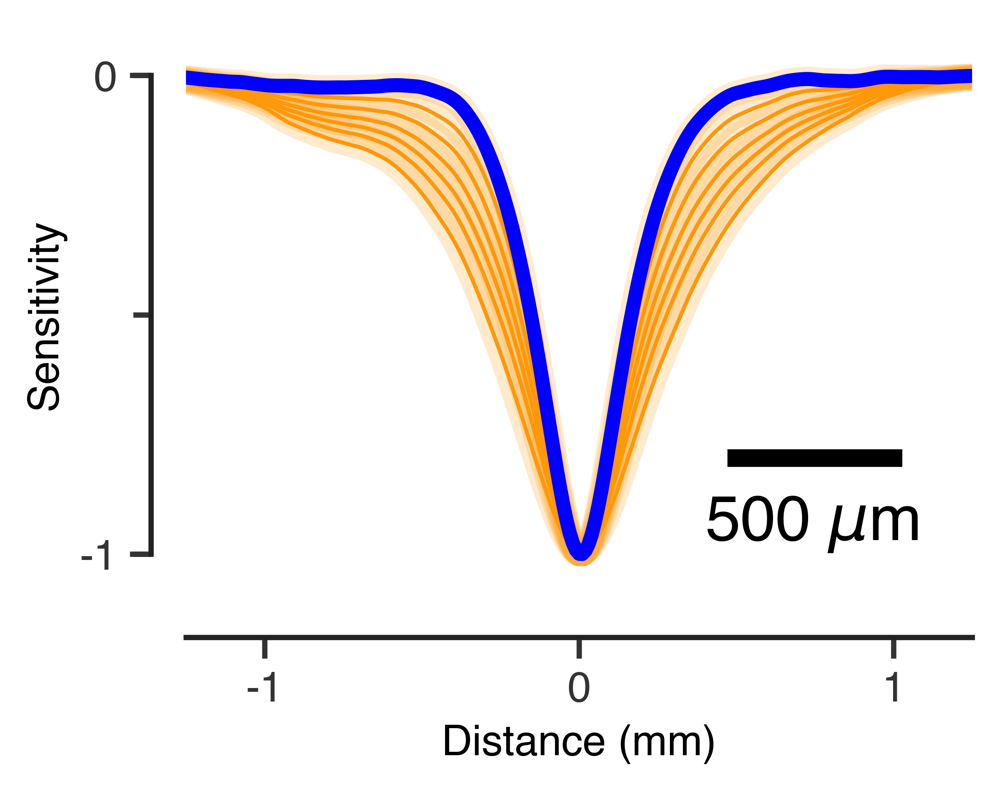

In [40]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]

fig = plt.gcf()
fig.set_size_inches((4,3))

for i,ganglion_surround in enumerate(surrounds['ganglion']):
    if np.min(ganglion_surround) != 0.0:
        if i > 0:
            if np.nanmax(cc_matrix[i,:i]) < 0.9995:
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=1.1, alpha=1)
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=7, alpha=0.2)
plt.plot(space*microns_per_degree/1000., -ama_pf/np.max(abs(ama_pf)), color='#0000FE', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

plt.plot([0.5, 1.0], [-.8, -.8], 'k', linewidth=5)
plt.text(0.4, -.97, '500 $\mu$m', fontsize=18)


plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('amacrine component with ganglion surrounds and thick thin lines.png', transparent=True)

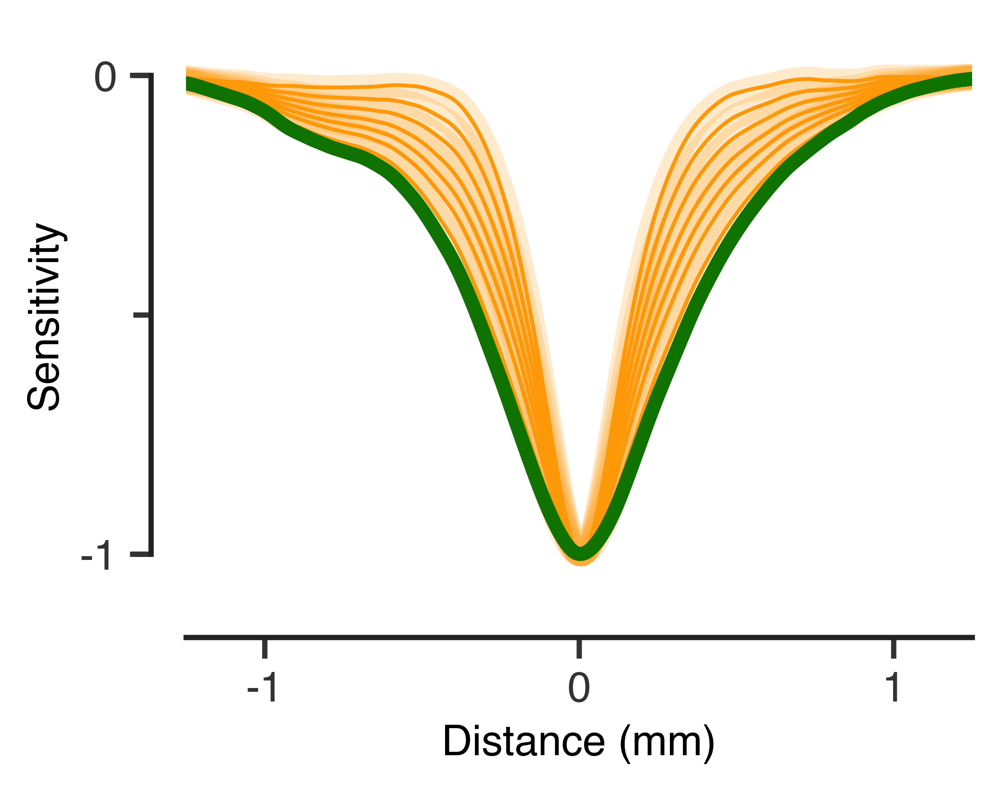

In [41]:
# ganglion_surround = np.mean(surrounds['ganglion'], axis=0)
# ganglion_surround = surrounds['ganglion'][9]

fig = plt.gcf()
fig.set_size_inches((4,3))

for i,ganglion_surround in enumerate(surrounds['ganglion']):
    if np.min(ganglion_surround) != 0.0:
        if i > 0:
            if np.nanmax(cc_matrix[i,:i]) < 0.9995:
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=1.1, alpha=1)
                plt.plot(space*microns_per_degree/1000., -ganglion_surround/np.max(abs(ganglion_surround)), color='#FD9809', 
                         linewidth=7, alpha=0.2)
plt.plot(space*microns_per_degree/1000., -horz_pf/np.max(abs(horz_pf)), color='#0F7201', linewidth=4)
# plt.plot(space, ama_surround/np.max(abs(ama_surround)), color='#0000FE', linewidth=4)
plt.xlabel('Distance (mm)')
plt.ylabel('Sensitivity')

majorLocator = MultipleLocator(1.0)
majorFormatter = FormatStrFormatter('%d')
minorLocator = MultipleLocator(0.5)

ax = plt.gca()
ax.xaxis.set_major_locator(majorLocator)
ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator)

# plt.plot([0.6, 0.7], [-.8, -.8], 'k')
# plt.text(0.43, -.89, '100 $\mu$m', fontsize=10)


plt.ylim(-1.1,0.1)
plt.xlim(common_x_start, common_x_end)
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())
plt.savefig('horizontal component with ganglion surrounds and thick thin lines.png', transparent=True)

## Quantification

In [42]:
microns_per_degree * np.array(interneuron_fits['horizontal']).min()

256.19853752803834

In [43]:
microns_per_degree * np.array(interneuron_fits['horizontal']).max()

452.52356655964883

In [44]:
microns_per_degree * np.array(interneuron_fits['amacrine']).min()

107.75797858052695

In [45]:
microns_per_degree * np.array(interneuron_fits['amacrine']).max()

283.87427550251647

#### Histogram of horizontal/amacrine weight

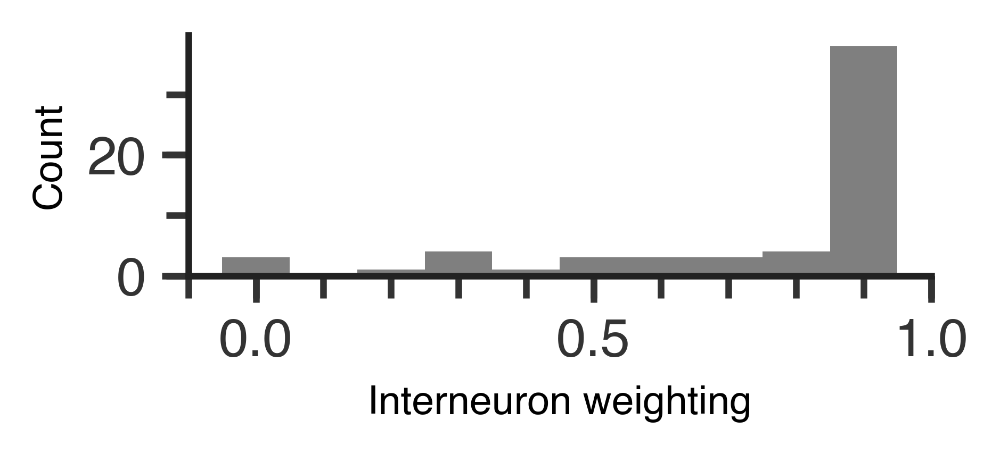

In [46]:
fig = plt.gcf()
fig.set_size_inches((3,1))

count, bins = np.histogram(fits['ganglion'][:,0], bins=10)
bin_width = np.mean(np.diff(bins))

plt.bar(bins[:-1], count, width=np.diff(bins), color='k', alpha=0.5)
plt.xlabel('Interneuron weighting', fontsize=9)
plt.ylabel('Count', fontsize=9)

majorLocator_y = MultipleLocator(20)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%d')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator_y)
ax.xaxis.set_major_locator(majorLocator_x)
ax.xaxis.set_minor_locator(minorLocator_x)



ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
plt.savefig('histogram of horz and center weightings.png', transparent=True)

#### Scatter plot of horizontal weight versus surround weight

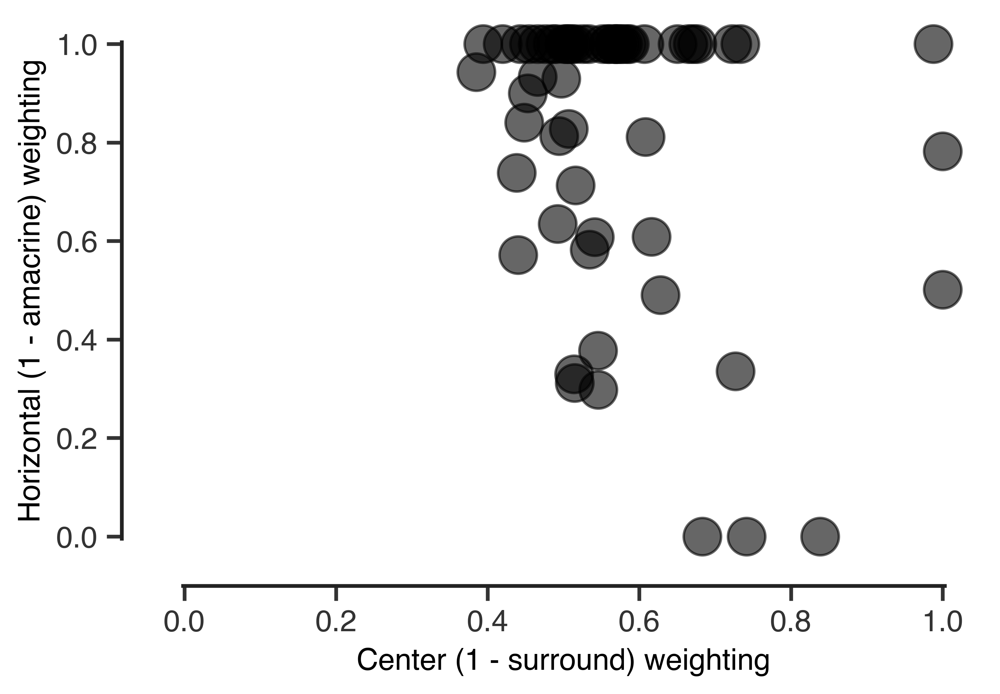

In [47]:
plt.scatter(fits[celltype][:,1], fits[celltype][:,0], c='k', alpha=0.6)
plt.scatter(0,0,c='w',edgecolor='w')
plt.xlim(-0.05,1.05)
plt.ylim(-0.05,1.05)
adjust_spines(plt.gca())
plt.ylabel('Horizontal (1 - amacrine) weighting')
plt.xlabel('Center (1 - surround) weighting')

plt.savefig('scatter plot of horz and center weightings.png', transparent=True)

## Try a histogram of horizontal and amacrine cell widths versus ganglion surround

In [48]:
ganglion_surround_fits = []
for surround in surrounds['ganglion']:
    popt, pcov = curve_fit(gaussian, space, surround, p0=[2.5, 0.0, 2.1])
    ganglion_surround_fits.append(abs(popt[0]))

/home/lane/.local/lib/python3.5/site-packages/scipy/optimize/minpack.py:779: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


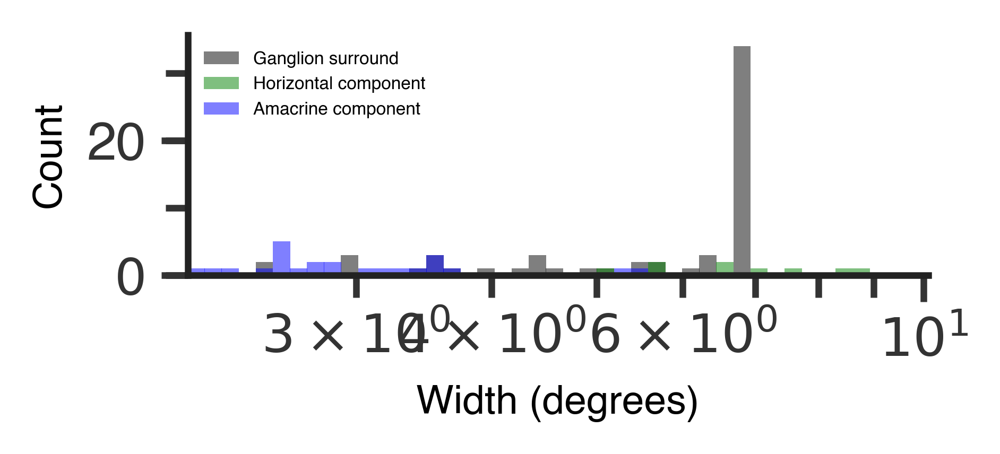

In [49]:
fig = plt.gcf()
fig.set_size_inches((3,1))

# bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
#                           np.min(interneuron_fits['amacrine']),
#                           np.min(surround_widths['ganglion'])]),
#                   np.max([np.max(interneuron_fits['horizontal']),
#                           np.max(interneuron_fits['amacrine']),
#                           np.max(surround_widths['ganglion'])]), 20)
bins = np.logspace(0.33, 1.1)

count_ganglion, bins = np.histogram(ganglion_surround_fits, bins=bins)
count_horz, bins = np.histogram(interneuron_fits['horizontal'], bins=bins)
count_ama, bins = np.histogram(interneuron_fits['amacrine'], bins=bins)
bin_width = np.mean(np.diff(bins))

plt.bar(bins[:-1], count_ganglion, width=np.diff(bins), color='k', alpha=0.5, label='Ganglion surround')
plt.bar(bins[:-1], count_horz, width=np.diff(bins), color='g', alpha=0.5, label='Horizontal component')
plt.bar(bins[:-1], count_ama, width=np.diff(bins), color='b', alpha=0.5, label='Amacrine component')
plt.legend(loc='upper left', frameon=False, fontsize=4)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Count', fontsize=9)
plt.xscale('log')
# plt.yscale('log')
plt.xlim([2.1, 10.1])

majorLocator_y = MultipleLocator(20)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%d')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')

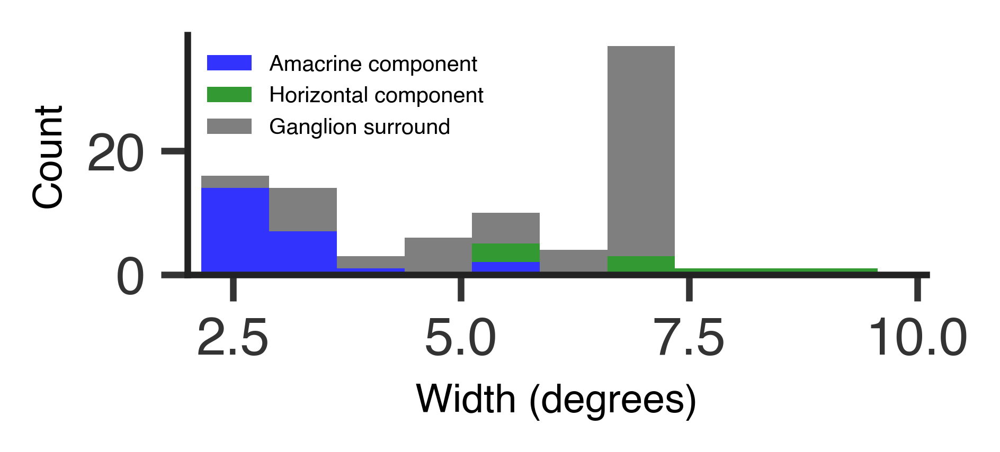

In [50]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

count_ganglion, bins = np.histogram(ganglion_surround_fits, bins=bins)
count_horz, bins = np.histogram(interneuron_fits['horizontal'], bins=bins)
count_ama, bins = np.histogram(interneuron_fits['amacrine'], bins=bins)
bin_width = np.mean(np.diff(bins))

plt.bar(bins[:-1] + bin_width/2, count_ama, width=np.diff(bins), color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.bar(bins[:-1] + bin_width/2, count_horz, bottom=count_ama, width=np.diff(bins), color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.bar(bins[:-1] + bin_width/2, count_ganglion, bottom=count_horz+count_ama, width=np.diff(bins), color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Count', fontsize=9)
plt.xlim([2, 10.1])

majorLocator_y = MultipleLocator(20)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%d')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

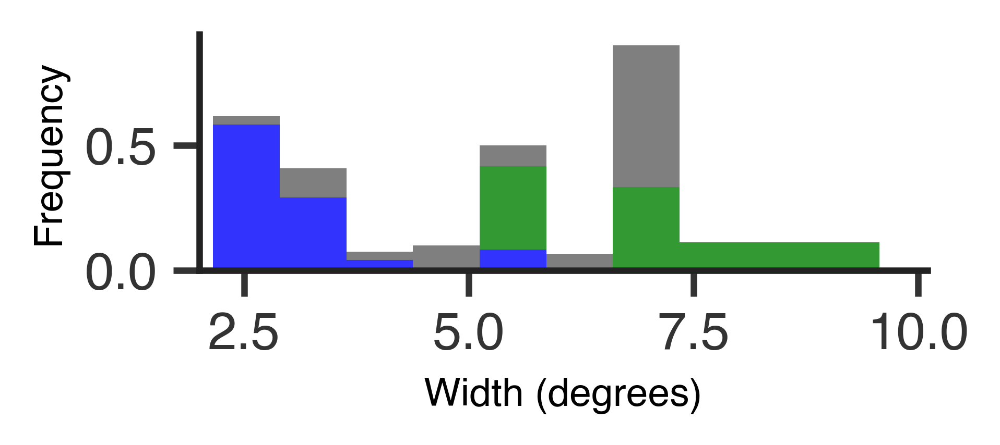

In [51]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

count_ganglion, bins = np.histogram(ganglion_surround_fits, bins=bins, density=True)
count_horz, bins = np.histogram(interneuron_fits['horizontal'], bins=bins, density=True)
count_ama, bins = np.histogram(interneuron_fits['amacrine'], bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.bar(bins[:-1] + bin_width/2, count_ama, width=np.diff(bins), color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.bar(bins[:-1] + bin_width/2, count_horz, bottom=count_ama, width=np.diff(bins), color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.bar(bins[:-1] + bin_width/2, count_ganglion, bottom=count_horz+count_ama, width=np.diff(bins), color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.xlim([2, 10.1])

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width stacked histogram for horz, ama, ganglion cells.png', transparent=True)

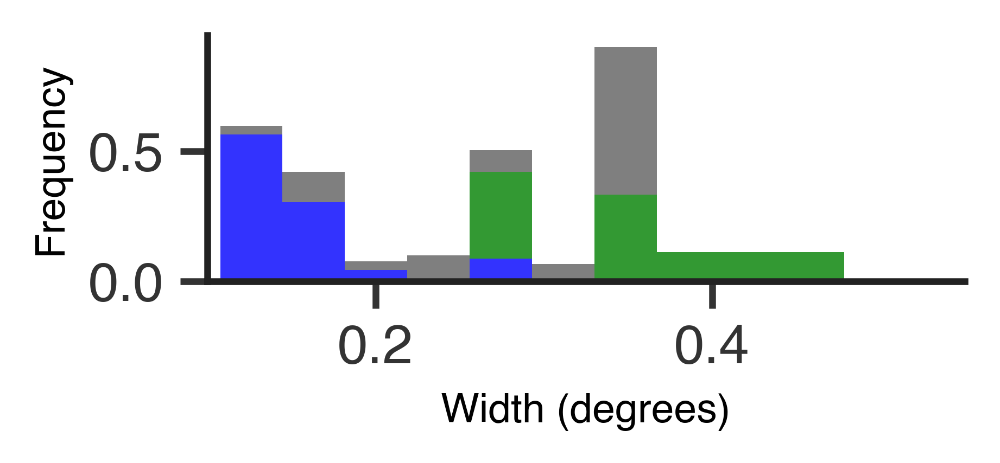

In [52]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

bins *= microns_per_degree/1000.

count_ganglion, bins = np.histogram(np.array(ganglion_surround_fits)*microns_per_degree/1000., bins=bins, density=True)
count_horz, bins = np.histogram(np.array(interneuron_fits['horizontal'])*microns_per_degree/1000., bins=bins, density=True)
count_ama, bins = np.histogram(np.array(interneuron_fits['amacrine'])*microns_per_degree/1000., bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.bar(bins[:-1] + bin_width/2, count_ama, width=np.diff(bins), color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.bar(bins[:-1] + bin_width/2, count_horz, bottom=count_ama, width=np.diff(bins), color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.bar(bins[:-1] + bin_width/2, count_ganglion, bottom=count_horz+count_ama, width=np.diff(bins), color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.xlim([0.1, 0.55])

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width stacked histogram mm for horz, ama, ganglion cells.png', transparent=True)

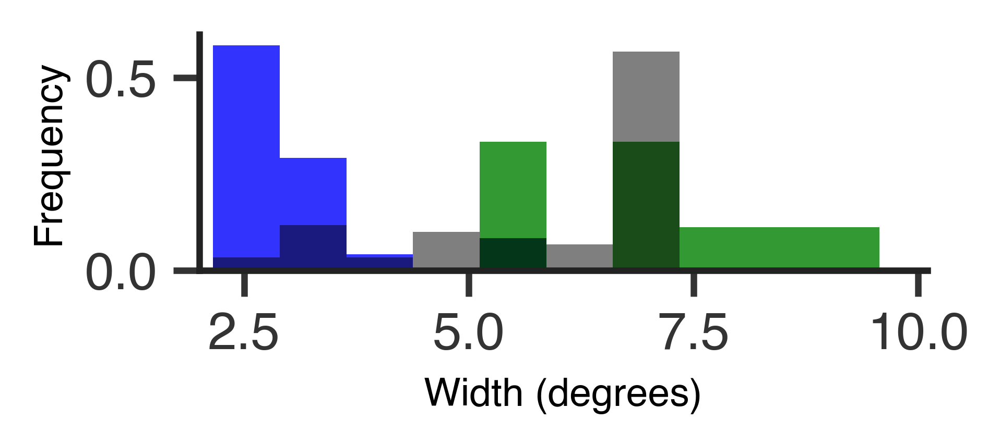

In [53]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

count_ganglion, bins = np.histogram(ganglion_surround_fits, bins=bins, density=True)
count_horz, bins = np.histogram(interneuron_fits['horizontal'], bins=bins, density=True)
count_ama, bins = np.histogram(interneuron_fits['amacrine'], bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.bar(bins[:-1] + bin_width/2, count_ama, width=np.diff(bins), color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.bar(bins[:-1] + bin_width/2, count_horz, width=np.diff(bins), color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.bar(bins[:-1] + bin_width/2, count_ganglion, width=np.diff(bins), color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.xlim([2, 10.1])

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

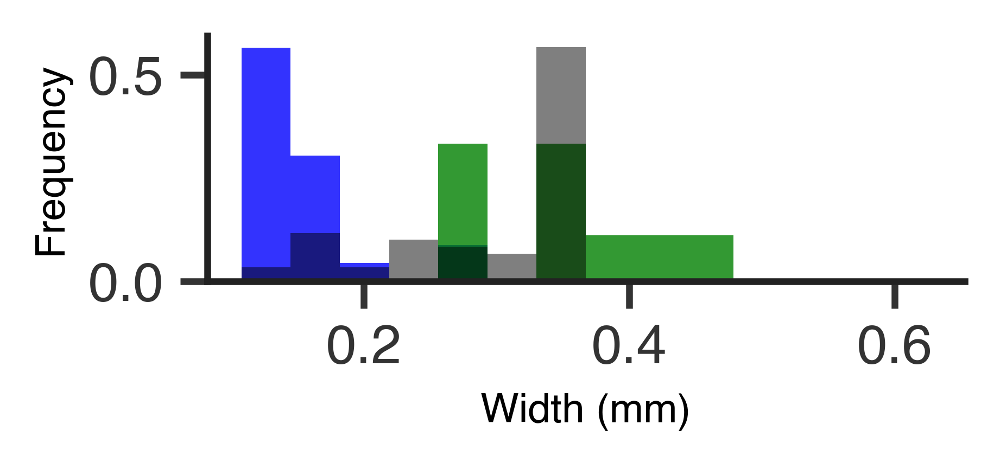

In [54]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

bins *= microns_per_degree/1000.

count_ganglion, bins = np.histogram(np.array(ganglion_surround_fits)*microns_per_degree/1000., bins=bins, density=True)
count_horz, bins = np.histogram(np.array(interneuron_fits['horizontal'])*microns_per_degree/1000., bins=bins, density=True)
count_ama, bins = np.histogram(np.array(interneuron_fits['amacrine'])*microns_per_degree/1000., bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.bar(bins[:-1] + bin_width/2, count_ama, width=np.diff(bins), color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.bar(bins[:-1] + bin_width/2, count_horz, width=np.diff(bins), color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.bar(bins[:-1] + bin_width/2, count_ganglion, width=np.diff(bins), color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (mm)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
# plt.xlim([2, 10.1])

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width histogram for horz, ama, ganglion cells.png', transparent=True)

In [55]:
count_ganglion

array([ 0.03333333,  0.11666667,  0.03333333,  0.1       ,  0.08333333,
        0.06666667,  0.56666667,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ])

### A plot like in Fig 1 G

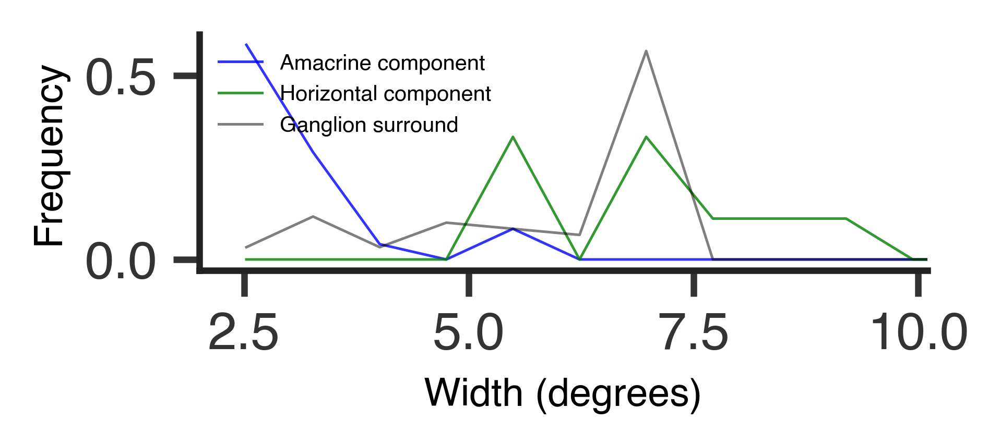

In [56]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

count_ganglion, bins = np.histogram(ganglion_surround_fits, bins=bins, density=True)
count_horz, bins = np.histogram(interneuron_fits['horizontal'], bins=bins, density=True)
count_ama, bins = np.histogram(interneuron_fits['amacrine'], bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.plot(bins[:-1] + bin_width/2, count_ama, color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.plot(bins[:-1] + bin_width/2, count_horz, color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.plot(bins[:-1] + bin_width/2, count_ganglion, color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')
plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (degrees)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.xlim([2, 10.1])

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.5)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
# ax.xaxis.set_major_locator(majorLocator_x)
# ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

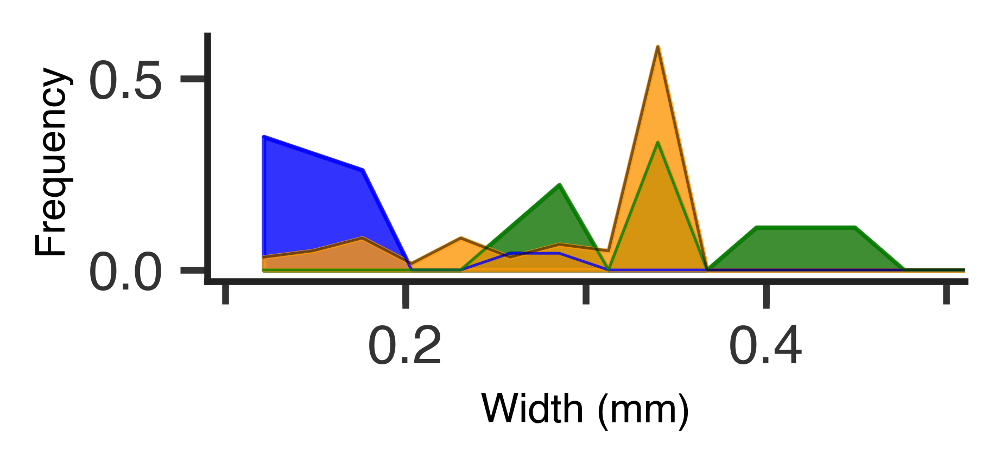

In [57]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 20)

bins *= microns_per_degree/1000.

count_ganglion, bins = np.histogram(np.array(ganglion_surround_fits)*microns_per_degree/1000., bins=bins, density=True)
count_horz, bins = np.histogram(np.array(interneuron_fits['horizontal'])*microns_per_degree/1000., bins=bins, density=True)
count_ama, bins = np.histogram(np.array(interneuron_fits['amacrine'])*microns_per_degree/1000., bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.plot(bins[:-1] + bin_width/2, count_ama, color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.plot(bins[:-1] + bin_width/2, count_horz, color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.plot(bins[:-1] + bin_width/2, count_ganglion, color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')

plt.fill_between(bins[:-1] + bin_width/2, 0, count_ama, color='#0000FE', alpha=0.8)
plt.fill_between(bins[:-1] + bin_width/2, 0, count_horz, color='#0F7201', alpha=0.8)
plt.fill_between(bins[:-1] + bin_width/2, 0, count_ganglion, color='#FD9809', alpha=0.8)

# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (mm)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
# plt.xlim([2, 10.1])
# plt.xlim(common_x_start, common_x_end)
# plt.xlim(0.09, 0.6005)
plt.xlim(0.09, 0.51)

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.2)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
ax.xaxis.set_major_locator(majorLocator_x)
ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width plot-like histogram for horz, ama, orange ganglion cells.png', transparent=True)

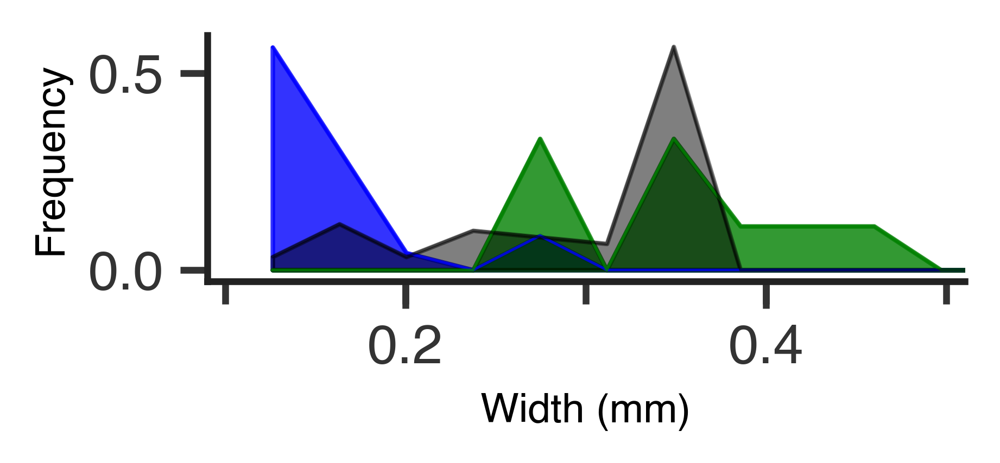

In [58]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 15)

bins *= microns_per_degree/1000.

count_ganglion, bins = np.histogram(np.array(ganglion_surround_fits)*microns_per_degree/1000., bins=bins, density=True)
count_horz, bins = np.histogram(np.array(interneuron_fits['horizontal'])*microns_per_degree/1000., bins=bins, density=True)
count_ama, bins = np.histogram(np.array(interneuron_fits['amacrine'])*microns_per_degree/1000., bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.plot(bins[:-1] + bin_width/2, count_ama, color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.plot(bins[:-1] + bin_width/2, count_horz, color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
plt.plot(bins[:-1] + bin_width/2, count_ganglion, color='k', 
        alpha=0.5, linewidth=0.6, label='Ganglion surround')

plt.fill_between(bins[:-1] + bin_width/2, 0, count_ama, color='#0000FE', alpha=0.8)
plt.fill_between(bins[:-1] + bin_width/2, 0, count_horz, color='g', alpha=0.8)
plt.fill_between(bins[:-1] + bin_width/2, 0, count_ganglion, color='k', alpha=0.5)

# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (mm)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
# plt.xlim([2, 10.1])
# plt.xlim(common_x_start, common_x_end)
# plt.xlim(0.09, 0.6005)
plt.xlim(0.09, 0.51)

majorLocator_y = MultipleLocator(0.5)
majorLocator_x = MultipleLocator(0.2)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
ax.xaxis.set_major_locator(majorLocator_x)
ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width plot-like histogram for horz, ama, ganglion cells.png', transparent=True)

In [76]:
interneuron_fits['amacrine']

[2.1551595716105392,
 3.1662540058265516,
 2.7463028043240851,
 2.5837004817778069,
 2.4884084814234586,
 2.3742426519070454,
 2.6114900984839204,
 3.2443554071907252,
 2.235543384290946,
 2.878000266202108,
 2.578866343207721,
 2.591348936419275,
 3.5512701878548847,
 3.5840958997143013,
 2.7646936094196262,
 2.565645945353511,
 3.4922952462904862,
 3.4149653599931367,
 3.5851555623756406,
 3.7706651328953495,
 5.3643579301331217,
 2.862866075604007,
 2.8112835110369301,
 5.677485510050329]

In [77]:
np.min(interneuron_fits['horizontal'])

5.1239707505607663

In [79]:
[(ida, a) for ida, a in enumerate(interneuron_fits['amacrine']) if a > np.min(interneuron_fits['horizontal'])]

[(20, 5.3643579301331217), (23, 5.677485510050329)]

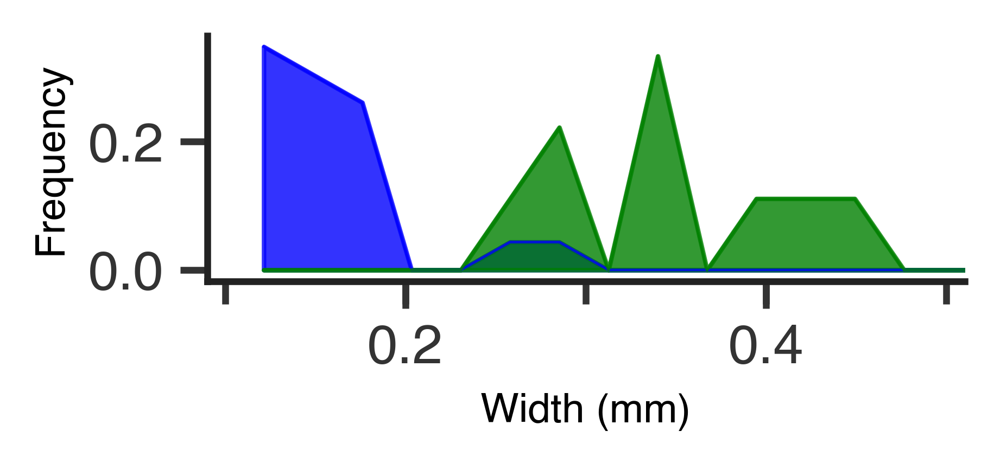

In [59]:
fig = plt.gcf()
fig.set_size_inches((3,1))

bins = np.linspace(np.min([np.min(interneuron_fits['horizontal']),
                          np.min(interneuron_fits['amacrine']),
                          np.min(surround_widths['ganglion'])]),
                  np.max([np.max(interneuron_fits['horizontal']),
                          np.max(interneuron_fits['amacrine']),
                          np.max(surround_widths['ganglion'])]), 20)

bins *= microns_per_degree/1000.

count_ganglion, bins = np.histogram(np.array(ganglion_surround_fits)*microns_per_degree/1000., bins=bins, density=True)
count_horz, bins = np.histogram(np.array(interneuron_fits['horizontal'])*microns_per_degree/1000., bins=bins, density=True)
count_ama, bins = np.histogram(np.array(interneuron_fits['amacrine'])*microns_per_degree/1000., bins=bins, density=True)
bin_width = np.mean(np.diff(bins))

count_ganglion /= np.sum(count_ganglion)
count_horz /= np.sum(count_horz)
count_ama /= np.sum(count_ama)

plt.plot(bins[:-1] + bin_width/2, count_ama, color='#0000FE', alpha=0.8, 
        linewidth=0.6, label='Amacrine component')
plt.plot(bins[:-1] + bin_width/2, count_horz, color='g', alpha=0.8, 
        linewidth=0.6, label='Horizontal component')
# plt.plot(bins[:-1] + bin_width/2, count_ganglion, color='k', 
#         alpha=0.5, linewidth=0.6, label='Ganglion surround')

plt.fill_between(bins[:-1] + bin_width/2, 0, count_ama, color='#0000FE', alpha=0.8)
plt.fill_between(bins[:-1] + bin_width/2, 0, count_horz, color='g', alpha=0.8)
# plt.fill_between(bins[:-1] + bin_width/2, 0, count_ganglion, color='k', alpha=0.5)

# plt.legend(loc='upper left', frameon=False, fontsize=5)
plt.xlabel('Width (mm)', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
# plt.xlim([2, 10.1])
# plt.xlim(common_x_start, common_x_end)
# plt.xlim(0.09, 0.6005)
plt.ylim()
plt.xlim(0.09, 0.51)

majorLocator_y = MultipleLocator(0.2)
majorLocator_x = MultipleLocator(0.2)
majorFormatter = FormatStrFormatter('%0.1f')
minorLocator_y = MultipleLocator(10)
minorLocator_x = MultipleLocator(0.1)

ax = plt.gca()
# ax.xaxis.set_major_locator(majorLocator)
# ax.xaxis.set_major_formatter(majorFormatter)
ax.yaxis.set_major_locator(majorLocator_y)
ax.yaxis.set_major_formatter(majorFormatter)
# ax.yaxis.set_minor_locator(minorLocator_y)
ax.xaxis.set_major_locator(majorLocator_x)
ax.xaxis.set_minor_locator(minorLocator_x)


ax1 = plt.gca()
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.xaxis.set_ticks_position('bottom')
ax1.yaxis.set_ticks_position('left')
# adjust_spines(plt.gca())

plt.savefig('width plot-like histogram for just horz and ama cells.png', transparent=True)

# Load transmission strength data to plot on common scale

In [60]:
firing_rate_change = {}
transmission_distances = {}

# amacrine transmission strength is frchangenorm vs dst
firing_rate_change['amacrine'] = np.loadtxt(os.path.expanduser('~/data/kastner/transmission/frchangenorm.txt'),
                                           skiprows=1)
transmission_distances['amacrine'] = np.loadtxt(os.path.expanduser('~/data/kastner/transmission/dst.txt'),
                                               skiprows=1)

# horizontal transmission strength is normslopehcchange_tot vs distancehc_tot
firing_rate_change['horizontal'] = np.loadtxt(os.path.expanduser('~/data/kastner/transmission/normslopehcchange_tot.txt'),
                                             skiprows=1)
transmission_distances['horizontal'] = np.loadtxt(os.path.expanduser('~/data/kastner/transmission/distancehc_tot.txt'),
                                                 skiprows=1)

#### Amacrine

(-1.25, 1.25)

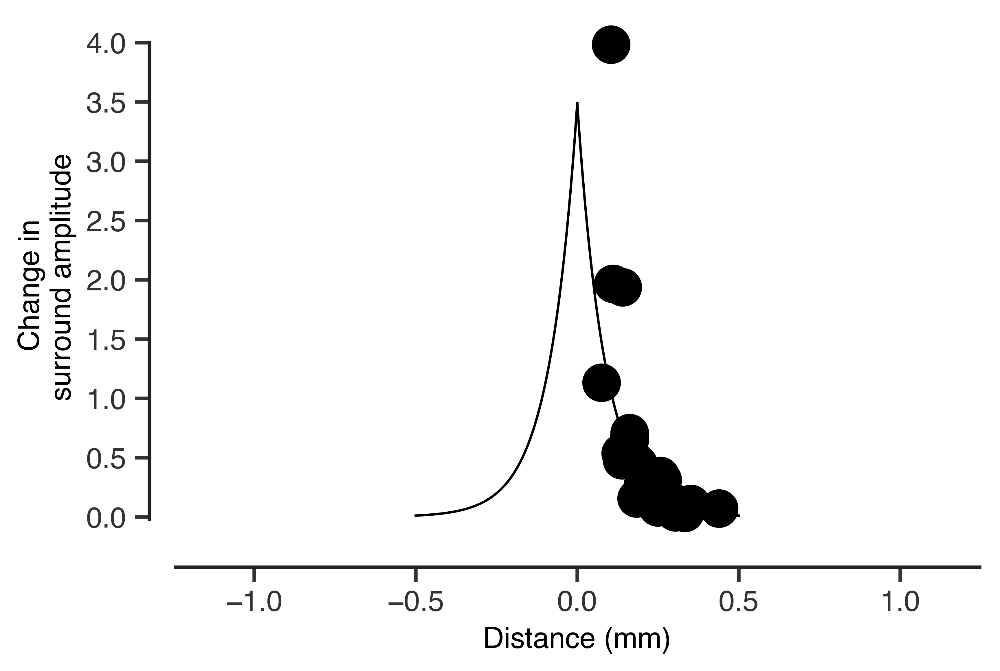

In [61]:
celltype = 'amacrine'

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 500:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .5, 100)
fit = np.exp(p[1] + p[0]*high_res_x)
plt.plot(high_res_x, fit, 'k', linewidth=1)
plt.plot(-high_res_x, fit, 'k', linewidth=1)

plt.scatter(x, y, c='k')
# plt.scatter(transmission_distances['amacrine']/1000., firing_rate_change['amacrine'], c='k')
# plt.yscale('log')
# plt.ylim(0.01, 10)
plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,0,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,0,c='w',edgecolor='w')
plt.xlim(common_x_start, common_x_end)

Space constant is 87.38 microns.


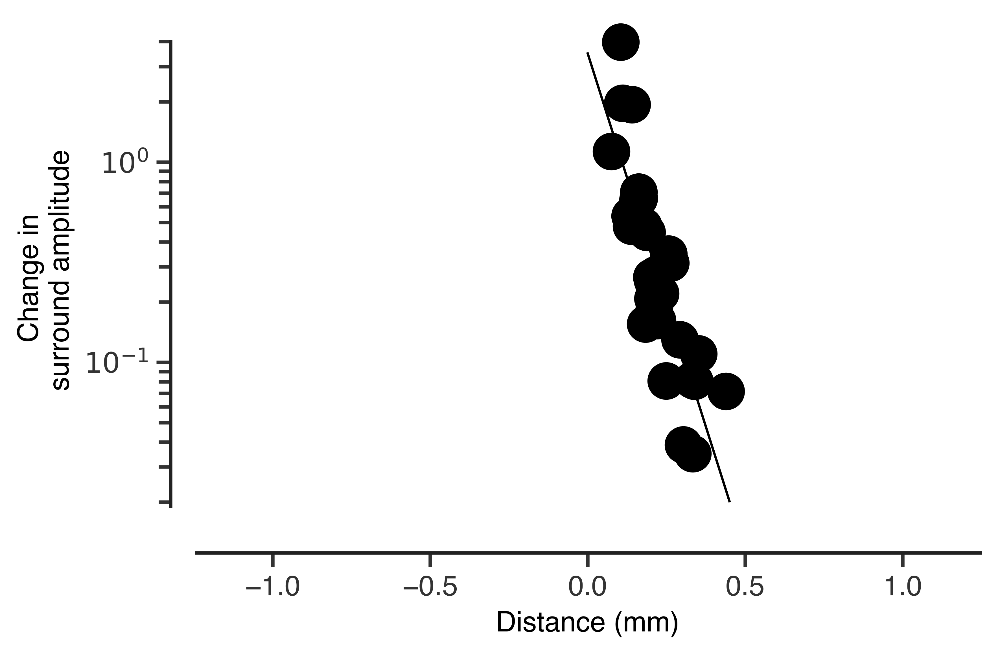

In [62]:
celltype = 'amacrine'

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 500:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .45, 100)
fit = np.exp(p[1] + p[0]*high_res_x)
plt.plot(high_res_x, fit, 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

plt.scatter(x, y, c='k')
# plt.scatter(transmission_distances['amacrine']/1000., firing_rate_change['amacrine'], c='k')
plt.yscale('log')
# plt.ylim(0.01, 10)
plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.xlim(common_x_start, common_x_end)
plt.savefig('amacrine transmission strength common axes.png', transparent=True)

Space constant is 139.30 microns.


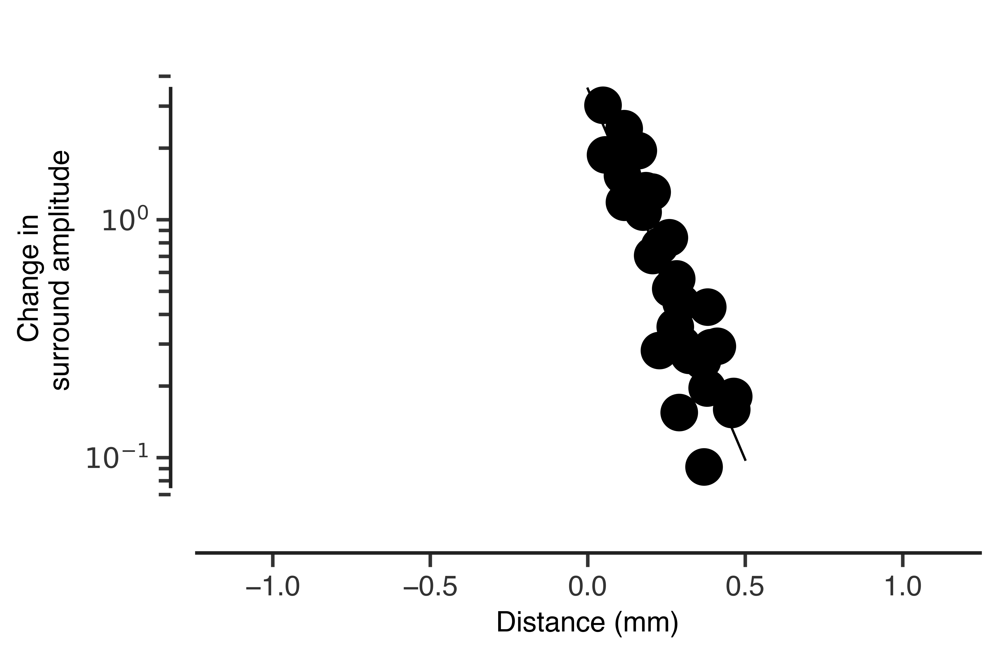

In [63]:
celltype = 'horizontal'

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 510:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .5, 100)
fit = np.exp(p[1] + p[0]*high_res_x)
plt.plot(high_res_x, fit, 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

plt.scatter(x, y, c='k')
# plt.scatter(transmission_distances[celltype]/1000., firing_rate_change[celltype], c='k')
plt.yscale('log')
# plt.ylim(0.01, 10)
plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,1,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,1,c='w',edgecolor='w')
plt.ylim(0.05, 7)
plt.xlim(common_x_start, common_x_end)
plt.savefig('horizontal transmission strength common axes.png', transparent=True)

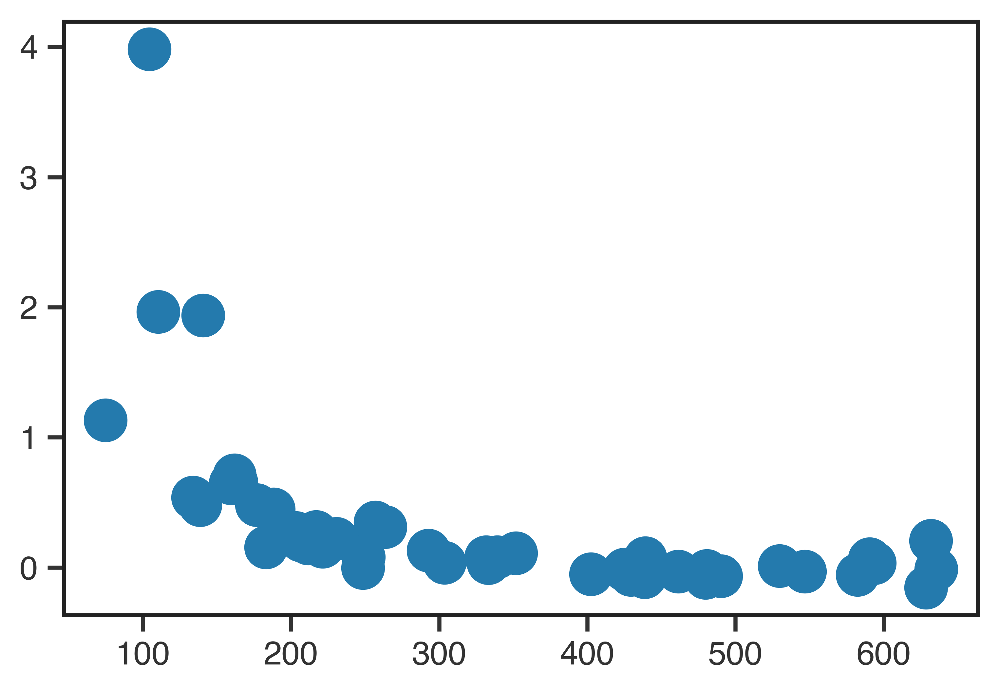

In [64]:
plt.scatter(transmission_distances['amacrine'], firing_rate_change['amacrine'])

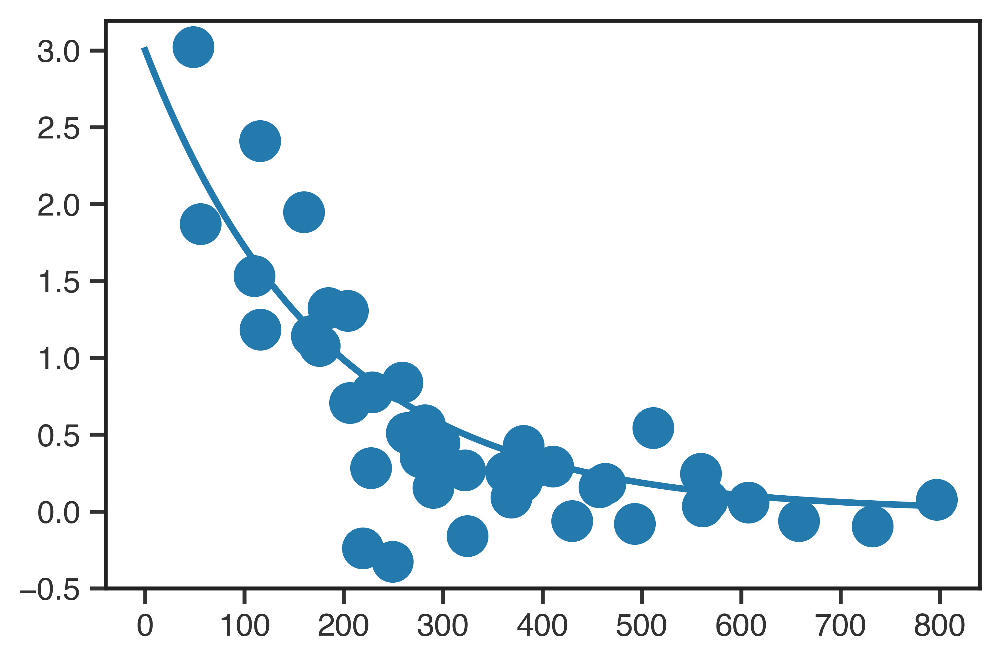

In [65]:
plt.scatter(transmission_distances['horizontal'], firing_rate_change['horizontal'])
tiling = np.linspace(0,800,200)
plt.plot(tiling, 3*np.exp(-tiling/180))

In [66]:
def param_exp(x, space_constant, const):
    return const * np.exp(- x/space_constant)

In [67]:
popt_horz, pcov = curve_fit(param_exp, transmission_distances['horizontal'], firing_rate_change['horizontal'],
         p0=[180, 3])

In [68]:
popt_horz

array([ 127.22375849,    3.96041062])

In [69]:
popt_ama, pcov = curve_fit(param_exp, transmission_distances['amacrine'], firing_rate_change['amacrine'],
         p0=[180, 3])

In [70]:
popt_ama

array([ 74.46702339,   6.66482471])

Space constant is 139.30 microns.


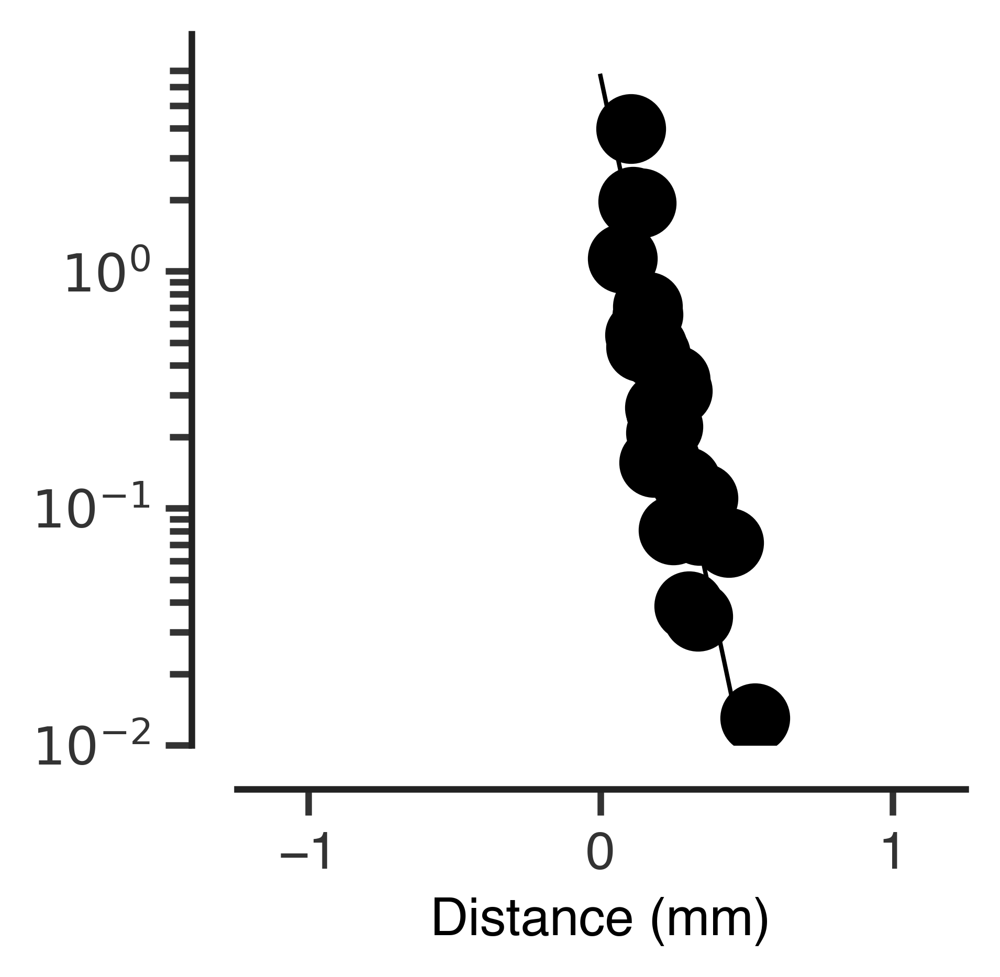

In [71]:
celltype = 'amacrine'

fig = plt.gcf()
fig.set_size_inches((3,3))

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 533:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

# p = np.polyfit(x, np.log(y), 1)
# high_res_x = np.linspace(0, .45, 100)
# fit = np.exp(p[1] + p[0]*high_res_x)

plt.plot(high_res_x, popt_ama[1]*np.exp(-high_res_x/(popt_ama[0]/1000.)), 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

plt.scatter(x, y, c='k')
# plt.scatter(transmission_distances['amacrine']/1000., firing_rate_change['amacrine'], c='k')
plt.yscale('log')
plt.ylim(0.01, 10)
# plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.xlim(common_x_start, common_x_end)
plt.savefig('amacrine transmission strength common axes exp fit.png', transparent=True)

Space constant is 139.30 microns.


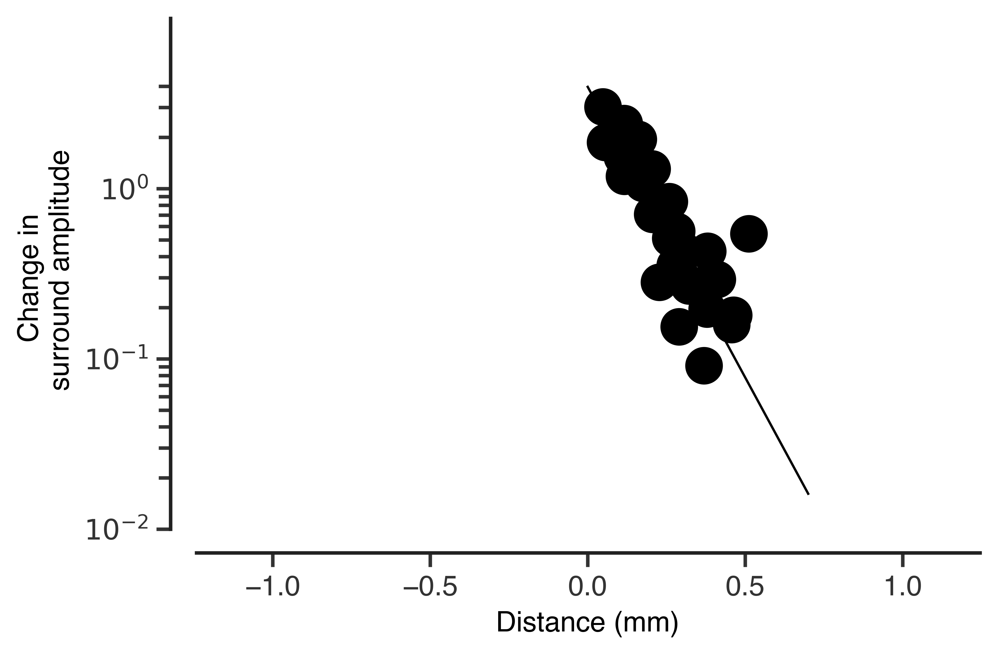

In [72]:
celltype = 'horizontal'

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 533:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

# p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .7, 100)
# fit = np.exp(p[1] + p[0]*high_res_x)

plt.plot(high_res_x, popt_horz[1]*np.exp(-high_res_x/(popt_horz[0]/1000.)), 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

plt.scatter(x, y, c='k')
# plt.scatter(transmission_distances['amacrine']/1000., firing_rate_change['amacrine'], c='k')
plt.yscale('log')
plt.ylim(0.01, 10)
plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.xlim(common_x_start, common_x_end)
plt.savefig('horizontal transmission strength common axes exp fit.png', transparent=True)

Space constant is 139.30 microns.


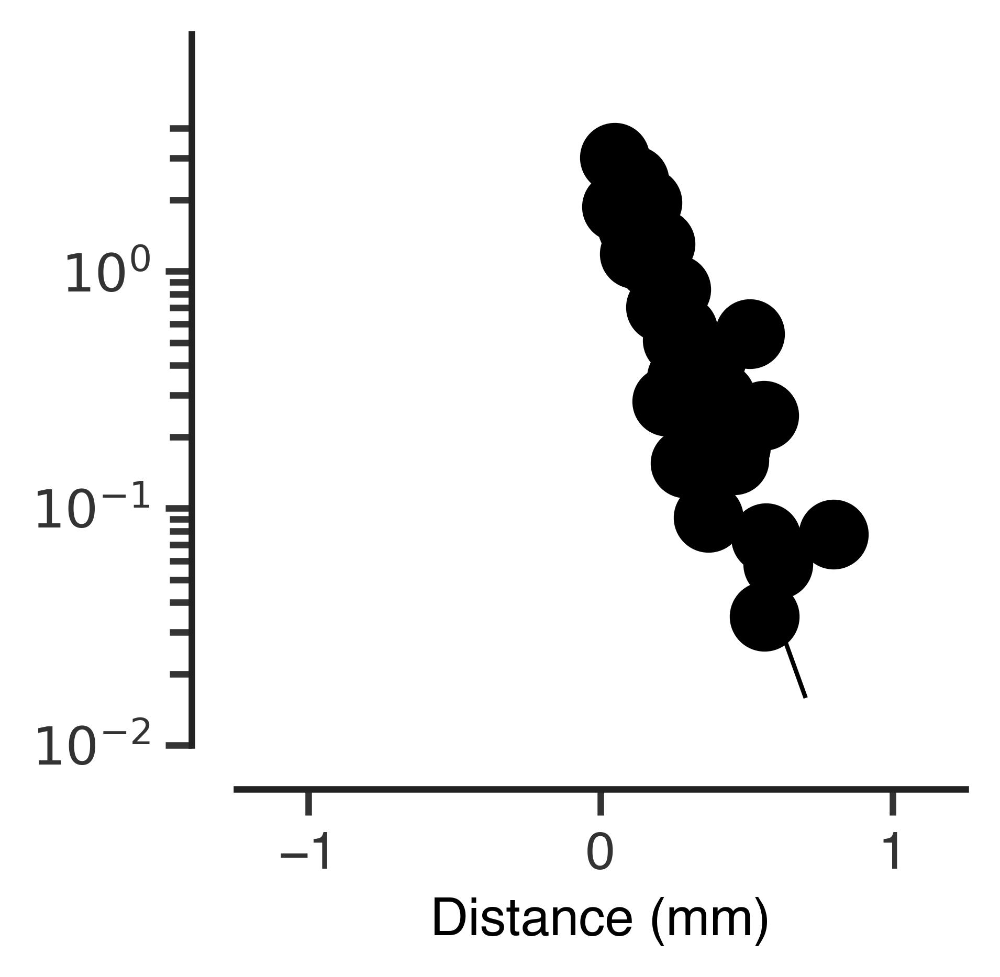

In [73]:
celltype = 'horizontal'

fig = plt.gcf()
fig.set_size_inches((3,3))

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 533:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

# p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .7, 100)
# fit = np.exp(p[1] + p[0]*high_res_x)

plt.plot(high_res_x, popt_horz[1]*np.exp(-high_res_x/(popt_horz[0]/1000.)), 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

# plt.scatter(x, y, c='k')
plt.scatter(transmission_distances[celltype]/1000., firing_rate_change[celltype], c='k')
plt.yscale('log')
plt.ylim(0.01, 10)
# plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.xlim(common_x_start, common_x_end)
plt.savefig('horizontal transmission strength common axes exp fit all cells.png', transparent=True)

Space constant is 139.30 microns.


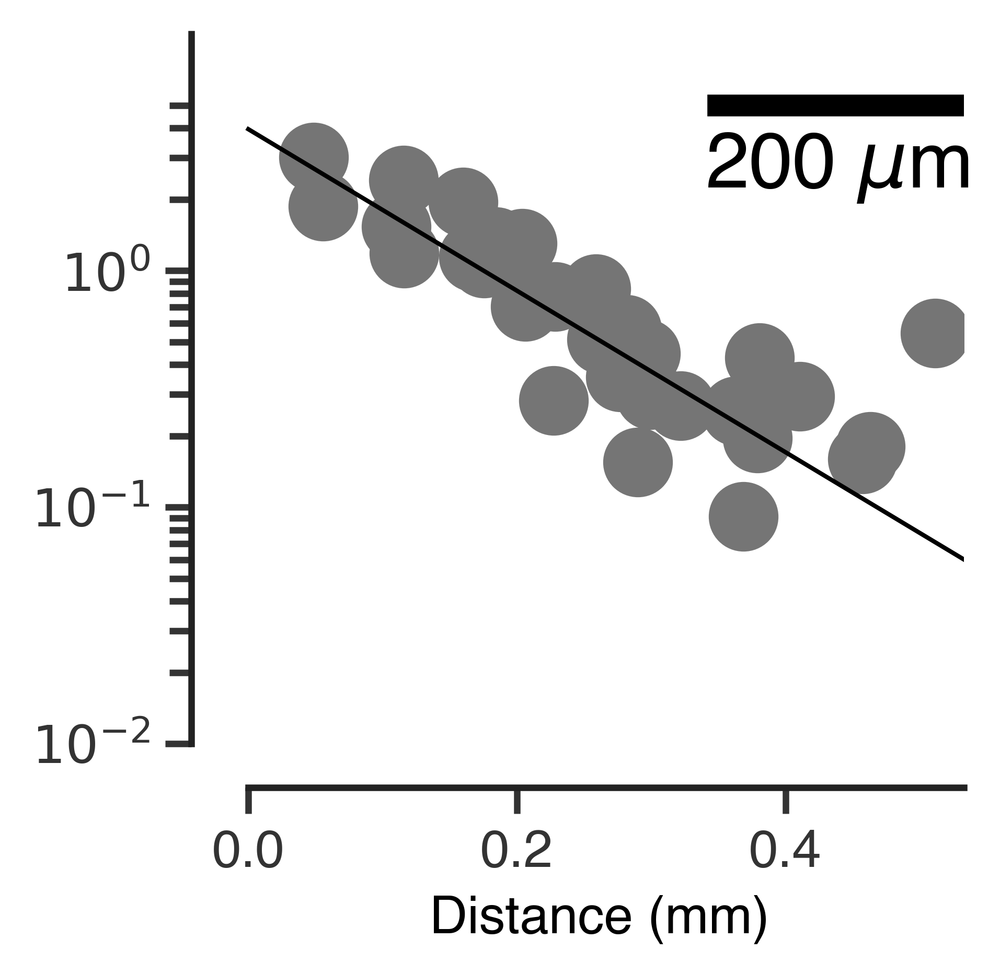

In [74]:
celltype = 'horizontal'

fig = plt.gcf()
fig.set_size_inches((3,3))

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 533:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

# p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .7, 100)
# fit = np.exp(p[1] + p[0]*high_res_x)

plt.plot(high_res_x, popt_horz[1]*np.exp(-high_res_x/(popt_horz[0]/1000.)), 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

# plt.scatter(x, y, c='k')
plt.scatter(transmission_distances[celltype]/1000., firing_rate_change[celltype], c='#757575', edgecolor='#757575')
plt.yscale('log')
plt.ylim(0.01, 10)
# plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

# plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
# plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.plot([0.35, 0.55], [5, 5], 'k', linewidth=5)
plt.text(0.34, 2.25, '200 $\mu$m', fontsize=18)


plt.xlim(-.01, .533)
plt.savefig('horizontal transmission strength common axes exp fit all cells 1 sided.png', transparent=True)

Space constant is 139.30 microns.


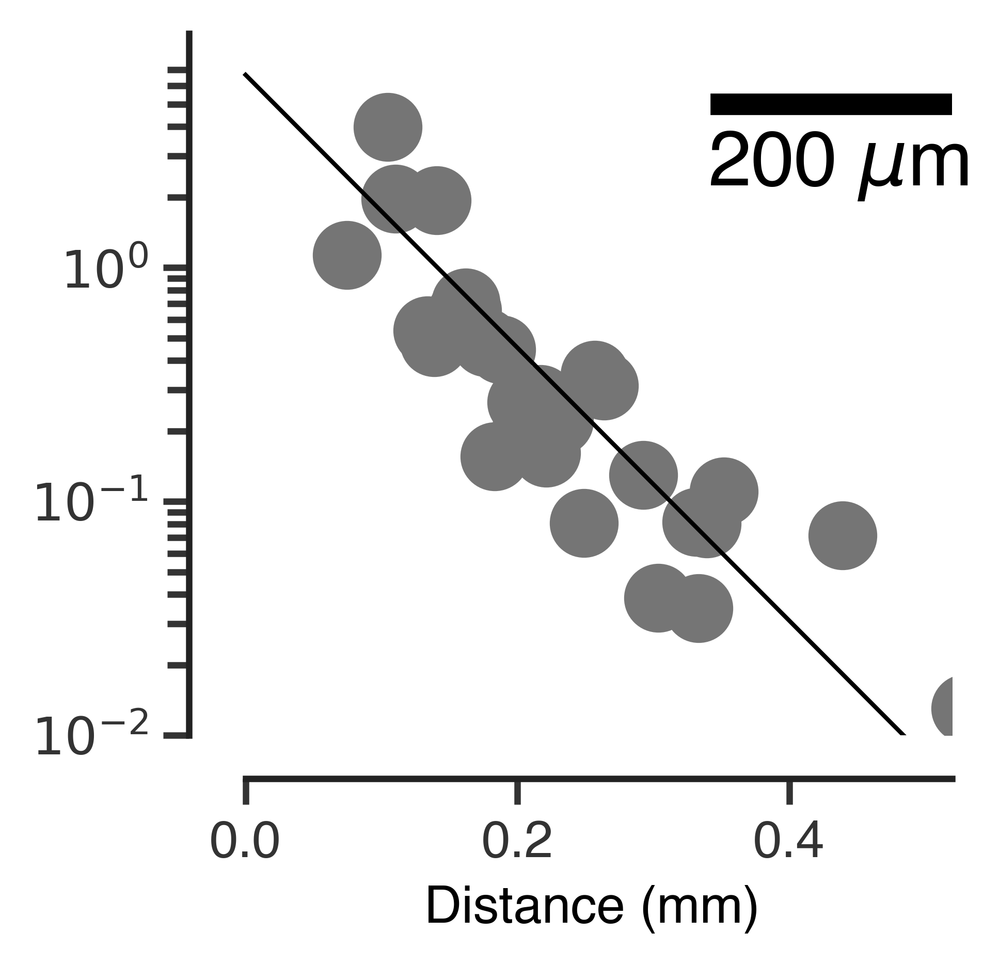

In [75]:
celltype = 'amacrine'

fig = plt.gcf()
fig.set_size_inches((3,3))

# fit line to slope
x = []
y = []
for i,fr in enumerate(firing_rate_change[celltype]):
    if fr > 0:
        if transmission_distances[celltype][i] < 533:
            x.append(transmission_distances[celltype][i]/1000.)
            y.append(firing_rate_change[celltype][i])
            
x = np.array(x)
y = np.array(y)

# p = np.polyfit(x, np.log(y), 1)
high_res_x = np.linspace(0, .7, 100)
# fit = np.exp(p[1] + p[0]*high_res_x)

plt.plot(high_res_x, popt_ama[1]*np.exp(-high_res_x/(popt_ama[0]/1000.)), 'k', linewidth=1)
# plt.plot(-high_res_x, fit, 'k', linewidth=1)

print('Space constant is %0.2f microns.' %((-1./p[0])*1000))

# plt.scatter(x, y, c='k')
plt.scatter(transmission_distances[celltype]/1000., firing_rate_change[celltype], c='#757575', edgecolor='#757575')
plt.yscale('log')
plt.ylim(0.01, 10)
# plt.ylabel('Change in \n surround amplitude')
plt.xlabel('Distance (mm)')
adjust_spines(plt.gca())

# plt.scatter(common_x_start+0.01,2,c='w',edgecolor='w')
# plt.scatter(common_x_end-0.01,2,c='w',edgecolor='w')
plt.plot([0.35, 0.55], [5, 5], 'k', linewidth=5)
plt.text(0.34, 2.25, '200 $\mu$m', fontsize=18)

# plt.plot([0.35, 0.45], [5, 5], 'k')
# plt.text(0.33, 2.6, '100 $\mu$m', fontsize=13)
plt.xlim(-.01, .52)
plt.savefig('amacrine transmission strength common axes exp fit all cells 1 sided.png', transparent=True)